# Nuclear scaling — analysis

Everything is read from `nuclear_scaling.db` and its radial-profile parquet
sidecars. No CSVs. Adding a replicate is one `build_db.py import` plus a re-run
of this notebook, unchanged.

**Kernel: `starforge`** — the TensorFlow env has no pyarrow and cannot read the
parquet.

All plotting code lives in these cells so you can edit it directly. Only
`nsdb.py` is imported as a module.

### Structure

Every figure is a time series. Four tracked nuclei (`FOCAL`) are followed through
each analysis so individual trajectories stay visible next to the population
summary — the question is how a nucleus changes, not what the population looked
like once.

`Nucleus_ID` in the export is the **track id**, so a nucleus keeps its identity
across frames and `FOCAL` selects the four longest-lived tracks.

### Known limits of the v18.1 export

| Limitation | Consequence |
|---|---|
| `Background_*`, `Halo*_NPC`, `Halo*_Membrane` empty | `nc_ratio` has no background subtraction — read the trend, not the level |
| `Rho_Normalized` is centre→wall | radial position is in ρ, not µm; `rho_wall` is reconstructed as a proxy |
| `Distance_px` not exported | no absolute radii anywhere |
| repair not written back to `grouped_z_df` | `nucleus_z_stack` areas are pre-repair — use `nuclei` for area |
| `Droplet_ID` empty | droplet unavailable as a grouping level |


## 1 · Setup

In [1]:
from pathlib import Path
import os, sys, warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=FutureWarning)


def find_project_root(marker="nsdb.py", start=None):
    """Anchor on a file so this runs from any machine or subdirectory."""
    here = (start or Path.cwd()).resolve()
    for d in (here, *here.parents):
        if (d / marker).exists():
            return d
    raise FileNotFoundError(f"no {marker} in {here} or any parent")


PROJECT = find_project_root()
DB      = PROJECT / "nuclear_scaling.db"
DERIVED = PROJECT / "Data" / "derived"
FIGDIR  = PROJECT / "figures"; FIGDIR.mkdir(exist_ok=True)

os.environ["NUCLEAR_SCALING_DB"]   = str(DB)
os.environ["NUCLEAR_SCALING_ROOT"] = str(DERIVED)
if str(PROJECT) not in sys.path:
    sys.path.insert(0, str(PROJECT))

import nsdb

pd.set_option("display.max_columns", 60, "display.width", 180)
plt.rcParams.update({"figure.dpi": 110, "savefig.dpi": 200,
                     "axes.spines.top": False, "axes.spines.right": False,
                     "font.size": 10})

EXPERIMENT   = "control_extract_1.1"
N_FOCAL      = 4
BIN_MIN      = 6.0
SHELLS       = [(0.00, 0.25), (0.25, 0.50), (0.50, 0.75), (0.75, 1.00)]
SHELL_COLORS = ["#7fd4b0", "#2fa383", "#4c6fbf", "#1a1a2e"]
FOCAL_COLORS = ["#c1121f", "#0a6f8a", "#e08214", "#5b3a91"]

print("python  :", sys.executable)
print("project :", PROJECT)
print("database:", DB.name, f"({DB.stat().st_size/1e6:.1f} MB)")

python  : /home/tdeibert/.conda/envs/starforge/bin/python
project : /home/tdeibert/Projects/Nuclear_Scaling
database: nuclear_scaling.db (1.4 MB)


## 2 · Inventory and integrity

In [2]:
display(nsdb.experiments()[["experiment_id", "experimental_group", "treatment",
                            "concentration", "biological_replicate", "experiment_date"]])
report = nsdb.audit()
display(report)
print("open issues:", *report.loc[~report.ok, "check"].tolist(), sep="\n  ")

,experiment_id,experimental_group,treatment,concentration,biological_replicate,experiment_date
0,control_extract_1.1,control,none,0.0,R1,2026-09-03


,check,n,ok
0,nuclei with no z-stack rows,0,True
1,selected_slice_id absent from z-stack,81,False
2,z-stack rows still marked unrepaired_stale,2215,False
3,nuclei with no tile assignment,0,True
4,nucleus-frames with no is_selected_max flag,81,False
5,nuclei with no intensity row,0,True
6,nuclei whose selected slice is not flagged is_...,0,True
7,area disagrees between nuclei and its selected...,181,False
8,nucleus_id reused across acquisitions,0,True
9,nucleus_id prefix disagrees with its metadata ...,0,True


open issues:
  selected_slice_id absent from z-stack
  z-stack rows still marked unrepaired_stale
  nucleus-frames with no is_selected_max flag
  area disagrees between nuclei and its selected z-stack plane
  nuclei still UNASSIGNED to a droplet


In [38]:
# nc_ratio is nm/cm (intensity ratio, unbounded — >1 means nuclear enrichment).
# The pipeline's nc_ratio_fraction = nm/(nm+cm) is bounded 0–1 but was never
# exported. It's recoverable exactly, since fraction = nc/(1+nc).
for _d in (df, df_all):
    _d["nc_fraction"] = _d.nc_ratio / (1 + _d.nc_ratio)

## 3 · Shared analysis helpers

The only reusable code in the notebook. Everything below is plotting you can
edit in place.

**Angle convention.** The sweep casts rays as `y = cy + r·sin θ` and image y
increases downward, so θ runs *clockwise* on screen with θ=0 pointing right.
`orient_polar` matches that.

In [3]:
def orient_polar(ax):
    """theta=0 at +x, increasing clockwise — matches the displayed image."""
    ax.set_theta_zero_location("E")
    ax.set_theta_direction(-1)


def boxplot(ax, data, labels, **kw):
    """boxplot with whichever tick-label kwarg this matplotlib accepts.

    `labels=` became `tick_labels=` in matplotlib 3.9 and was later removed.
    """
    try:
        return ax.boxplot(data, tick_labels=labels, **kw)
    except TypeError:
        return ax.boxplot(data, labels=labels, **kw)


def short(nid):
    """'control_extract_1.1|FOV01|N000082' -> 'N000082'."""
    return str(nid).split("|")[-1]


def resultant(theta_rad, weight):
    """Weighted circular resultant -> (R, phi). R=0 isotropic, R=1 one direction."""
    w = np.asarray(weight, dtype=float)
    ok = np.isfinite(w) & np.isfinite(theta_rad) & (w > 0)
    if ok.sum() == 0 or w[ok].sum() <= 0:
        return np.nan, np.nan
    z = np.sum(w[ok] * np.exp(1j * theta_rad[ok])) / w[ok].sum()
    return float(abs(z)), float(np.angle(z))


def angular_profile(df, n_bins=36):
    """Bin one nucleus/frame/shell by angle -> (theta_rad, mean_intensity, n_samples).

    NaN where no ray sampled that wedge — that happens where the droplet wall
    clips the sweep, which is exactly why R_geom below is needed.
    """
    edges = np.linspace(0, 360, n_bins + 1)
    idx = pd.cut(df["theta_deg"] % 360, edges, labels=False, include_lowest=True)
    g = df.assign(_b=idx).groupby("_b")["intensity"]
    mean = g.mean().reindex(range(n_bins)).to_numpy(dtype=float)
    count = g.size().reindex(range(n_bins)).fillna(0).to_numpy(dtype=float)
    return np.radians(0.5 * (edges[:-1] + edges[1:])), mean, count


def add_rho_wall_proxy(sweep):
    """Reconstruct a surface-referenced radius: 0 at the nuclear surface, 1 at the wall.

    The pipeline's rho_wall needs distance_px and inside_nucleus, neither of
    which is exported. Per ray, the intensity maximum marks the NE/membrane
    ring, so it stands in for the nuclear surface:

        rho_wall_proxy = (rho - rho_peak) / (1 - rho_peak),  clipped to [0, 1]

    PROXY, not the real thing. The true surface is the last sample inside the
    nucleus mask, which sits slightly INSIDE the ring peak, so this reads a
    little large. Interior samples all clip to 0 — filter with `> 0` to keep
    the perinuclear region only.
    """
    key = ["nucleus_id", "time_frame", "theta_deg"]
    peak = (sweep.loc[sweep.groupby(key)["intensity"].idxmax(), key + ["rho_normalized"]]
            .rename(columns={"rho_normalized": "rho_peak"}))
    out = sweep.merge(peak, on=key, how="left")
    out["rho_wall_proxy"] = ((out.rho_normalized - out.rho_peak)
                             / (1 - out.rho_peak)).clip(0, 1)
    return out


def ray_peaks(sweep):
    """Per ray: the rho at which intensity peaks (the pipeline plots this in µm)."""
    idx = sweep.groupby(["nucleus_id", "time_frame", "theta_deg"])["intensity"].idxmax()
    return (sweep.loc[idx, ["nucleus_id", "time_frame", "theta_deg",
                            "rho_normalized", "intensity"]]
            .rename(columns={"rho_normalized": "rho_at_peak",
                             "intensity": "peak_intensity"}))


def asymmetry(sweep, shells=SHELLS, n_bins=36, baseline_pct=10.0,
              radius_col="rho_normalized"):
    """Per (nucleus, frame, shell) membrane asymmetry.

    R       intensity-weighted resultant after subtracting a per-shell baseline
    phi     its direction (radians, image convention)
    R_geom  resultant of the SAMPLE COUNTS alone — the apparent asymmetry an
            isotropic nucleus would show from droplet-wall clipping. R has to
            beat R_geom to mean anything.
    p       Rayleigh approximation exp(-n_eff*R^2), where n_eff is the effective
            weight count, so a profile carried by two bright bins is not
            credited with the full bin count.
    """
    rows = []
    for (nid, t), g in sweep.groupby(["nucleus_id", "time_frame"], sort=False):
        for lo, hi in shells:
            sub = g[(g[radius_col] > lo) & (g[radius_col] <= hi)]
            if sub.empty:
                continue
            th, mean, count = angular_profile(sub, n_bins)
            filled = np.isfinite(mean)
            if filled.sum() < 3:
                continue
            w = np.clip(mean - np.nanpercentile(mean[filled], baseline_pct), 0, None)
            w[~filled] = 0.0
            R, phi = resultant(th, w)
            Rg, _ = resultant(th, count)
            n_eff = (w.sum() ** 2 / np.sum(w ** 2)) if np.sum(w ** 2) > 0 else 0.0
            rows.append(dict(nucleus_id=nid, time_frame=t, shell=f"({lo:.2f}, {hi:.2f}]",
                             shell_lo=lo, shell_hi=hi, R=R, phi=phi, R_geom=Rg,
                             n_eff=n_eff, n_samples=len(sub),
                             p=float(np.exp(-n_eff * R ** 2)) if R == R else np.nan))
    return pd.DataFrame(rows)


def population_direction(asym):
    """Do nuclei agree on a lab-frame direction? Each nucleus gets unit weight."""
    rows = []
    for (shell, t), g in asym.groupby(["shell", "time_frame"]):
        phi = g["phi"].dropna().to_numpy()
        if phi.size == 0:
            continue
        R, mean_phi = resultant(phi, np.ones_like(phi))
        rows.append(dict(shell=shell, time_frame=t, n=phi.size, R_pop=R,
                         mean_phi=mean_phi, p=float(np.exp(-phi.size * R ** 2))))
    return pd.DataFrame(rows)


def sweep_grid(df, rho_bins=60, radius_col="rho_normalized", agg="mean", close_theta=True):
    """Bin a long-form sweep into a regular theta x rho grid for plot_surface.

    Each ray has a different sample count, so rho must be binned before the
    pivot. theta is closed by repeating the first ray at +360 so there is no seam.
    """
    edges = np.linspace(0, 1, rho_bins + 1)
    d = df[df[radius_col].between(0, 1)].copy()
    d["rb"] = pd.cut(d[radius_col], edges, labels=False, include_lowest=True)
    grid = (d.pivot_table(index="theta_deg", columns="rb", values="intensity", aggfunc=agg)
            .reindex(columns=range(rho_bins)))
    theta, z = grid.index.to_numpy(dtype=float), grid.to_numpy(dtype=float)
    if close_theta and theta.size > 1:
        theta = np.append(theta, theta[0] + 360.0)
        z = np.vstack([z, z[0]])
    rho = 0.5 * (edges[:-1] + edges[1:])
    THETA, RHO = np.meshgrid(theta, rho, indexing="ij")
    return THETA, RHO, z


def fill_gaps(z):
    """Interpolate NaN holes along rho. plot_surface renders NaN as a hole, and
    outer rho bins go sparse as rays shorten. Does not extrapolate past the
    ends — a bin with no data anywhere stays a hole, because that is real."""
    out = z.copy()
    for i in range(out.shape[0]):
        row, ok = out[i], ~np.isnan(out[i])
        if ok.sum() >= 2:
            idx = np.arange(row.size)
            out[i] = np.interp(idx, idx[ok], row[ok], left=np.nan, right=np.nan)
    return out


def polar_xy(THETA, RHO):
    """theta/rho grid -> Cartesian, so a surface sits over the nucleus footprint."""
    th = np.radians(THETA)
    return RHO * np.cos(th), RHO * np.sin(th)


print("helpers loaded")

helpers loaded


## 4 · Nuclei table and the focal tracks

`Nucleus_ID` is the track id, so a nucleus keeps its identity across frames.
`FOCAL` is the four longest-lived tracks — the ones with enough timepoints to
show a trajectory rather than a point.

In [4]:
df     = nsdb.nuclei(experiment=EXPERIMENT, qc="PASS")
df_all = nsdb.nuclei(experiment=EXPERIMENT, qc=None)
print(df.shape, "PASS  /", df_all.shape, "all")

span = (df_all.groupby("nucleus_id")
        .agg(n_frames=("time_frame", "nunique"),
             first=("time_frame", "min"), last=("time_frame", "max"))
        .sort_values(["n_frames", "first"], ascending=[False, True]))
FOCAL = span.head(N_FOCAL).index.tolist()
FC    = dict(zip(FOCAL, FOCAL_COLORS))

# Frames to analyse: those the focal tracks actually span.
FRAMES = sorted(df_all.loc[df_all.nucleus_id.isin(FOCAL), "time_frame"].unique())

print("\nfocal tracks:")
display(span.head(N_FOCAL))
print("frames:", FRAMES)

(1096, 45) PASS  / (1269, 45) all

focal tracks:


,n_frames,first,last
nucleus_id,,,
control_extract_1.1|FOV01|N000082,7,3,9
control_extract_1.1|FOV01|N000112,6,3,8
control_extract_1.1|FOV01|N000254,6,4,9
control_extract_1.1|FOV01|N000258,6,4,9


frames: [np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9)]


## 5 · Cross-sectional area over time

Population in grey, the four focal tracks in colour. `time_min` is the true
per-tile acquisition time, not `time_frame x 6` — nuclei in different tiles of
one frame were imaged up to 5 minutes apart.

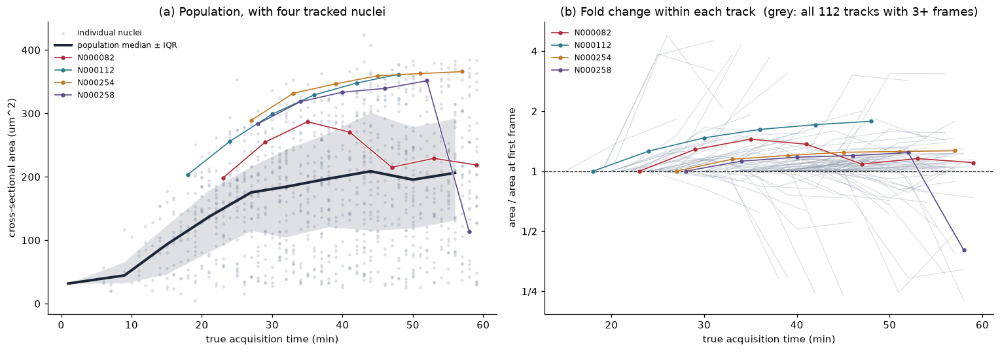

In [30]:
# Supplemental: four tracked nuclei against the population.
# Design notes — the population is the figure, the tracks are annotation:
#   * scatter is darker and larger so 1096 points outweigh 4 lines
#   * traces are thin with small markers and a white halo, so they read over
#     the scatter without dominating it
#   * panel (b) is log2 — a halving and a doubling are the same magnitude, and
#     on a linear axis the one track that shrinks stretches the whole range

FOCAL_COLORS_MUTED = ["#b02a35", "#2b7a8f", "#c07a24", "#5c4a8a"]
FCM = dict(zip(FOCAL, FOCAL_COLORS_MUTED))
MIN_FRAMES = 3          # tracks with fewer points cannot show a trajectory

fig, (a, b) = plt.subplots(1, 2, figsize=(14, 5))

# ---- (a) population, with the focal tracks over it -------------------------
a.scatter(df.time_min, df.cross_sectional_area_um2, s=9, alpha=.30,
          color="#8a97a8", lw=0, label="individual nuclei", zorder=1)
med = df.groupby("time_frame").agg(t=("time_min", "median"),
                                   m=("cross_sectional_area_um2", "median"),
                                   lo=("cross_sectional_area_um2", lambda s: s.quantile(.25)),
                                   hi=("cross_sectional_area_um2", lambda s: s.quantile(.75)))
a.fill_between(med.t, med.lo, med.hi, color="#33415c", alpha=.16, lw=0, zorder=2)
a.plot(med.t, med.m, "-", color="#1c2536", lw=2.6, zorder=3,
       label="population median ± IQR")

for nid in FOCAL:
    g = df_all[df_all.nucleus_id == nid].sort_values("time_min")
    a.plot(g.time_min, g.cross_sectional_area_um2, "-", lw=2.6, color="white",
           alpha=.85, zorder=4, solid_capstyle="round")
    a.plot(g.time_min, g.cross_sectional_area_um2, "-o", lw=1.1, ms=3.2,
           color=FCM[nid], zorder=5, label=short(nid))

a.set_xlabel("true acquisition time (min)")
a.set_ylabel("cross-sectional area (um^2)")
a.set_title("(a) Population, with four tracked nuclei")
a.legend(frameon=False, fontsize=8, loc="upper left")

# ---- (b) fold change, every track for context ------------------------------
span_n = df_all.groupby("nucleus_id").time_frame.nunique()
for nid in span_n[span_n >= MIN_FRAMES].index:
    g = df_all[df_all.nucleus_id == nid].sort_values("time_min")
    v = g.cross_sectional_area_um2.to_numpy()
    if v.size and v[0] > 0:
        b.plot(g.time_min, v / v[0], "-", color="#8a97a8", lw=.7, alpha=.35, zorder=1)

for nid in FOCAL:
    g = df_all[df_all.nucleus_id == nid].sort_values("time_min")
    v = g.cross_sectional_area_um2.to_numpy()
    if not v.size or v[0] <= 0:
        continue
    b.plot(g.time_min, v / v[0], "-", lw=2.6, color="white", alpha=.85, zorder=3)
    b.plot(g.time_min, v / v[0], "-o", lw=1.1, ms=3.2, color=FCM[nid], zorder=4,
           label=short(nid))

b.set_yscale("log", base=2)
b.set_yticks([0.25, 0.5, 1, 2, 4])
b.set_yticklabels(["1/4", "1/2", "1", "2", "4"])
b.axhline(1.0, color="k", lw=.8, ls="--", zorder=2)
b.set_xlabel("true acquisition time (min)")
b.set_ylabel("area / area at first frame")
b.set_title(f"(b) Fold change within each track  "
            f"(grey: all {int((span_n >= MIN_FRAMES).sum())} tracks with "
            f"{MIN_FRAMES}+ frames)")
b.legend(frameon=False, fontsize=8, loc="upper left")

fig.tight_layout()
fig.savefig(FIGDIR / "area_focal_tracks.png", bbox_inches="tight")

tracks with 3+ frames: 112



,n tracks,% of baseline,median final log2FC,% ending below start
none,112.0,100.0,0.184,25.0
flag_stable,78.0,69.6,0.191,16.7
no_shrink,83.0,74.1,0.311,6.0



flag_stable removes tracks on a segmentation property; no_shrink removes
them on the thing being measured, so its last two columns are meaningless.

FILTER='no_shrink': 83 tracks, 295 rows, 2/4 focal tracks retained


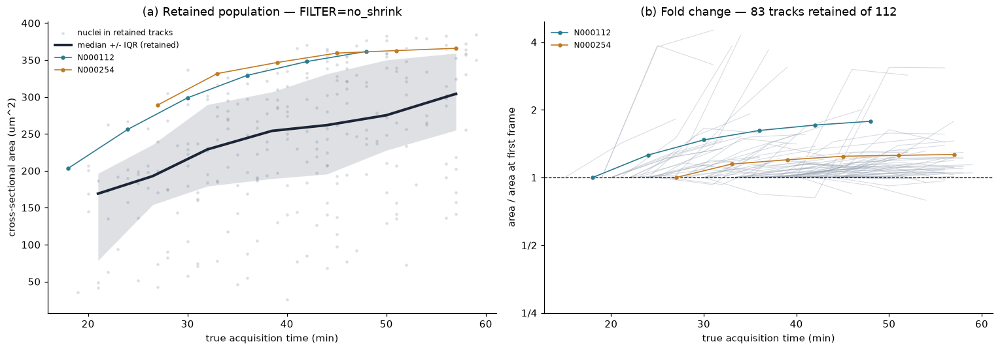

In [32]:
# ---------------------------------------------------------------------------
# TEST / DIAGNOSTIC CELL — one-off, informational. Not a fix.
#
# Purpose: find out how much of the negative fold change survives when suspect
# tracks are removed, and how much the answer depends on WHICH rule removes them.
#
#   "none"        every track with MIN_FRAMES+ points (the baseline figure)
#   "flag_stable" tracks whose zstack_consistency is 'consistent' at EVERY
#                 frame. Filters on the CAUSE — a segmentation property decided
#                 without reference to area — so this one is defensible.
#   "no_shrink"   tracks with no step below SHRINK_CUT. Filters on the OUTCOME:
#                 removing tracks because they shrank guarantees the survivors
#                 grow. DIAGNOSTIC ONLY — never put this in a figure.
#
# Read the comparison table, then decide. It writes a PNG only for the mode in
# FILTER.
# ---------------------------------------------------------------------------
FILTER     = "no_shrink"     # "none" | "flag_stable" | "no_shrink"
MIN_FRAMES = 3
SHRINK_CUT = -0.3              # log2; -0.3 is roughly a 19% loss in one step

trk = df_all.sort_values(["nucleus_id", "time_frame"]).copy()
gb = trk.groupby("nucleus_id")
trk["log2_step"] = np.log2(trk.cross_sectional_area_um2 / gb.cross_sectional_area_um2.shift())

per_track = trk.groupby("nucleus_id").agg(
    n_frames=("time_frame", "nunique"),
    all_consistent=("zstack_consistency", lambda s: bool((s == "consistent").all())),
    worst_step=("log2_step", "min"),
    first_area=("cross_sectional_area_um2", "first"),
    last_area=("cross_sectional_area_um2", "last"))
per_track["final_log2fc"] = np.log2(per_track.last_area / per_track.first_area)
long_enough = per_track.n_frames >= MIN_FRAMES

MASKS = {
    "none":        long_enough,
    "flag_stable": long_enough & per_track.all_consistent,
    "no_shrink":   long_enough & (per_track.worst_step.fillna(0) >= SHRINK_CUT),
}

print(f"tracks with {MIN_FRAMES}+ frames: {int(long_enough.sum())}\n")
summary = pd.DataFrame({
    name: {"n tracks": int(m.sum()),
           "% of baseline": round(100 * m.sum() / long_enough.sum(), 1),
           "median final log2FC": round(per_track.loc[m, "final_log2fc"].median(), 3),
           "% ending below start": round(
               100 * (per_track.loc[m, "final_log2fc"] < 0).mean(), 1)}
    for name, m in MASKS.items()}).T
display(summary)
print("\nflag_stable removes tracks on a segmentation property; no_shrink removes")
print("them on the thing being measured, so its last two columns are meaningless.")

# ---------------------------------------------------------------------------
keep = set(per_track.index[MASKS[FILTER]])
sub  = df_all[df_all.nucleus_id.isin(keep)]
sub_pass = df[df.nucleus_id.isin(keep)]
focal_kept = [n for n in FOCAL if n in keep]
print(f"\nFILTER={FILTER!r}: {len(keep)} tracks, {len(sub)} rows, "
      f"{len(focal_kept)}/{len(FOCAL)} focal tracks retained")

FOCAL_COLORS_MUTED = ["#b02a35", "#2b7a8f", "#c07a24", "#5c4a8a"]
FCM = dict(zip(FOCAL, FOCAL_COLORS_MUTED))

fig, (a, b) = plt.subplots(1, 2, figsize=(14, 5))

a.scatter(sub_pass.time_min, sub_pass.cross_sectional_area_um2, s=9, alpha=.30,
          color="#8a97a8", lw=0, label="nuclei in retained tracks", zorder=1)
med = sub_pass.groupby("time_frame").agg(
    t=("time_min", "median"), m=("cross_sectional_area_um2", "median"),
    lo=("cross_sectional_area_um2", lambda s: s.quantile(.25)),
    hi=("cross_sectional_area_um2", lambda s: s.quantile(.75)))
a.fill_between(med.t, med.lo, med.hi, color="#33415c", alpha=.16, lw=0, zorder=2)
a.plot(med.t, med.m, "-", color="#1c2536", lw=2.6, zorder=3,
       label="median +/- IQR (retained)")
for nid in focal_kept:
    g = sub[sub.nucleus_id == nid].sort_values("time_min")
    a.plot(g.time_min, g.cross_sectional_area_um2, "-", lw=2.6, color="white",
           alpha=.85, zorder=4)
    a.plot(g.time_min, g.cross_sectional_area_um2, "-o", lw=1.1, ms=3.2,
           color=FCM[nid], zorder=5, label=short(nid))
a.set_xlabel("true acquisition time (min)")
a.set_ylabel("cross-sectional area (um^2)")
a.set_title(f"(a) Retained population — FILTER={FILTER}")
a.legend(frameon=False, fontsize=8, loc="upper left")

for nid in keep:
    g = sub[sub.nucleus_id == nid].sort_values("time_min")
    v = g.cross_sectional_area_um2.to_numpy()
    if v.size and v[0] > 0:
        b.plot(g.time_min, v / v[0], "-", color="#8a97a8", lw=.7, alpha=.35, zorder=1)
for nid in focal_kept:
    g = sub[sub.nucleus_id == nid].sort_values("time_min")
    v = g.cross_sectional_area_um2.to_numpy()
    b.plot(g.time_min, v / v[0], "-", lw=2.6, color="white", alpha=.85, zorder=3)
    b.plot(g.time_min, v / v[0], "-o", lw=1.1, ms=3.2, color=FCM[nid], zorder=4,
           label=short(nid))
b.set_yscale("log", base=2)
b.set_yticks([0.25, 0.5, 1, 2, 4]); b.set_yticklabels(["1/4", "1/2", "1", "2", "4"])
b.axhline(1.0, color="k", lw=.8, ls="--", zorder=2)
b.set_xlabel("true acquisition time (min)")
b.set_ylabel("area / area at first frame")
b.set_title(f"(b) Fold change — {len(keep)} tracks retained of "
            f"{int(long_enough.sum())}")
if focal_kept:
    b.legend(frameon=False, fontsize=8, loc="upper left")

fig.tight_layout()
fig.savefig(FIGDIR / f"area_focal_tracks_{FILTER}.png", bbox_inches="tight")

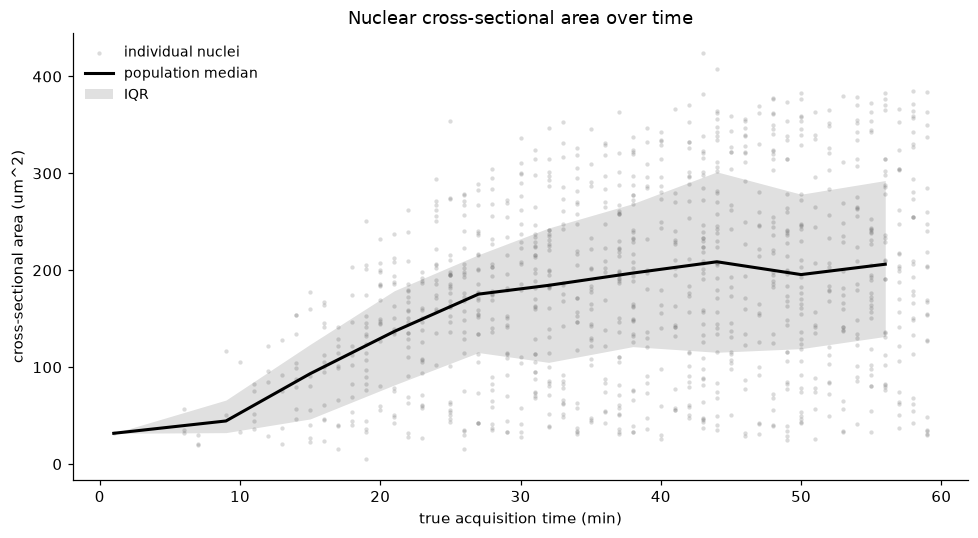

In [26]:
fig, ax = plt.subplots(figsize=(9, 5))

ax.scatter(df.time_min, df.cross_sectional_area_um2, s=8, alpha=.25,
           color="0.45", lw=0, label="individual nuclei")
med = df.groupby("time_frame").agg(t=("time_min", "median"),
                                   m=("cross_sectional_area_um2", "median"),
                                   lo=("cross_sectional_area_um2", lambda s: s.quantile(.25)),
                                   hi=("cross_sectional_area_um2", lambda s: s.quantile(.75)))
ax.plot(med.t, med.m, "-", color="k", lw=2, label="population median")
ax.fill_between(med.t, med.lo, med.hi, color="k", alpha=.12, lw=0, label="IQR")

ax.set_xlabel("true acquisition time (min)")
ax.set_ylabel("cross-sectional area (um^2)")
ax.set_title("Nuclear cross-sectional area over time")
ax.legend(frameon=False, fontsize=9)
fig.tight_layout()
fig.savefig(FIGDIR / "area_timecourse.png", bbox_inches="tight")

### 5b · Binned distribution with the focal tracks overlaid

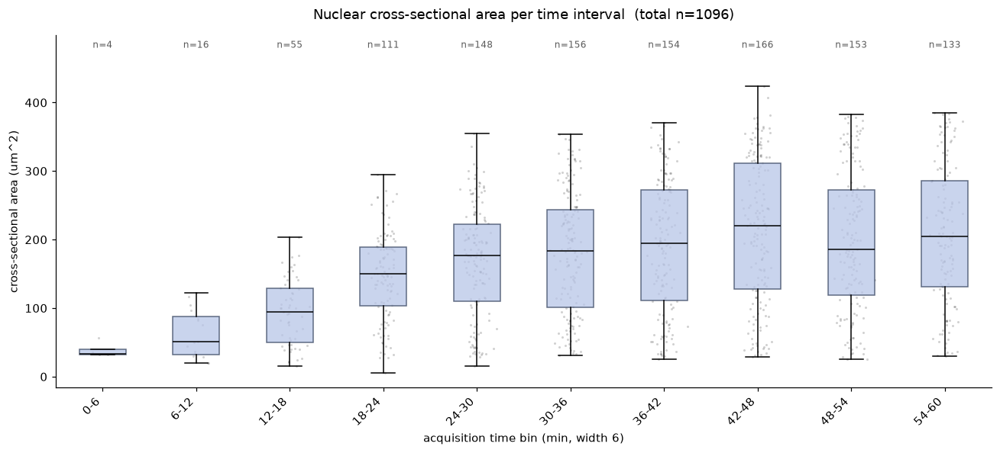

In [27]:
edges = np.arange(0, df.time_min.max() + BIN_MIN, BIN_MIN)
labels = [f"{int(x)}-{int(y)}" for x, y in zip(edges[:-1], edges[1:])]
d = df.assign(bin=pd.cut(df.time_min, edges, labels=labels,
                         include_lowest=True)).dropna(subset=["bin"])
order = [c for c in labels if (d["bin"] == c).any()]
data = [d.loc[d["bin"] == c, "cross_sectional_area_um2"].to_numpy() for c in order]

fig, ax = plt.subplots(figsize=(12, 5.5))
bp = boxplot(ax, data, order, patch_artist=True, showfliers=False,
             medianprops=dict(color="k"))
for box in bp["boxes"]:
    box.set(facecolor="#b8c6e8", alpha=.75, edgecolor="#33415c")
for i, v in enumerate(data, start=1):
    ax.scatter(np.random.normal(i, .07, v.size), v, s=4, color="k", alpha=.18, lw=0)

# Headroom first, then place counts in AXES coordinates so they sit below the
# title whatever the data range. Annotating in data coords put them on top of it.
ax.set_ylim(top=ax.get_ylim()[1] * 1.12)
for i, v in enumerate(data, start=1):
    ax.annotate(f"n={v.size}", xy=(i, .985), xycoords=("data", "axes fraction"),
                ha="center", va="top", fontsize=8, color="0.35")

ax.set_xlabel(f"acquisition time bin (min, width {int(BIN_MIN)})")
ax.set_ylabel("cross-sectional area (um^2)")
ax.set_title(f"Nuclear cross-sectional area per time interval  "
             f"(total n={sum(v.size for v in data)})", pad=14)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
fig.tight_layout()
fig.savefig(FIGDIR / "area_bins.png", bbox_inches="tight")

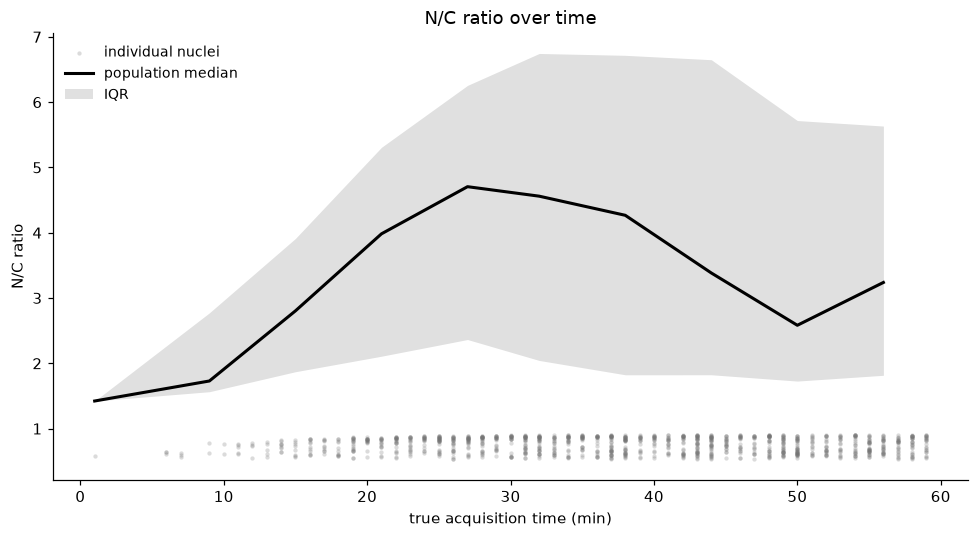

In [41]:
fig, ax = plt.subplots(figsize=(9, 5))

ax.scatter(df.time_min, df.nc_fraction, s=8, alpha=.25, color="0.45", lw=0,
           label="individual nuclei")
q = df.groupby("time_frame").agg(t=("time_min", "median"), m=("nc_ratio", "median"),
                                 lo=("nc_ratio", lambda s: s.quantile(.25)),
                                 hi=("nc_ratio", lambda s: s.quantile(.75)))
ax.plot(q.t, q.m, "-", color="k", lw=2, label="population median")
ax.fill_between(q.t, q.lo, q.hi, color="k", alpha=.12, lw=0, label="IQR")

ax.set_xlabel("true acquisition time (min)")
ax.set_ylabel("N/C ratio")
ax.set_title("N/C ratio over time")
ax.legend(frameon=False, fontsize=9)
fig.tight_layout()
fig.savefig(FIGDIR / "nc_ratio.png", bbox_inches="tight")

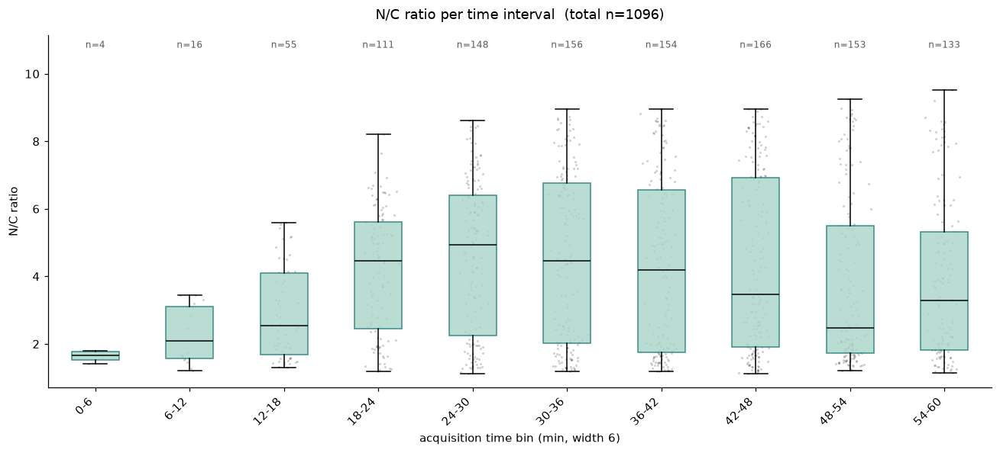

In [29]:
edges = np.arange(0, df.time_min.max() + BIN_MIN, BIN_MIN)
labels = [f"{int(x)}-{int(y)}" for x, y in zip(edges[:-1], edges[1:])]
d = df.assign(bin=pd.cut(df.time_min, edges, labels=labels,
                         include_lowest=True)).dropna(subset=["bin"])
order = [c for c in labels if (d["bin"] == c).any()]
data = [d.loc[d["bin"] == c, "nc_ratio"].dropna().to_numpy() for c in order]

fig, ax = plt.subplots(figsize=(12, 5.5))
bp = boxplot(ax, data, order, patch_artist=True, showfliers=False,
             medianprops=dict(color="k"))
for box in bp["boxes"]:
    box.set(facecolor="#a8d5c8", alpha=.8, edgecolor="#14746f")
for i, v in enumerate(data, start=1):
    ax.scatter(np.random.normal(i, .07, v.size), v, s=4, color="k", alpha=.18, lw=0)

ax.set_ylim(top=ax.get_ylim()[1] * 1.12)
for i, v in enumerate(data, start=1):
    ax.annotate(f"n={v.size}", xy=(i, .985), xycoords=("data", "axes fraction"),
                ha="center", va="top", fontsize=8, color="0.35")

ax.set_xlabel(f"acquisition time bin (min, width {int(BIN_MIN)})")
ax.set_ylabel("N/C ratio")
ax.set_title(f"N/C ratio per time interval  (total n={sum(v.size for v in data)})", pad=14)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
fig.tight_layout()
fig.savefig(FIGDIR / "nc_ratio_bins.png", bbox_inches="tight")

## 6 · N/C ratio over time

From the mCherry halos with **no background subtraction** — the `background_*`
columns are empty in the export. Read the shape, not the absolute level.

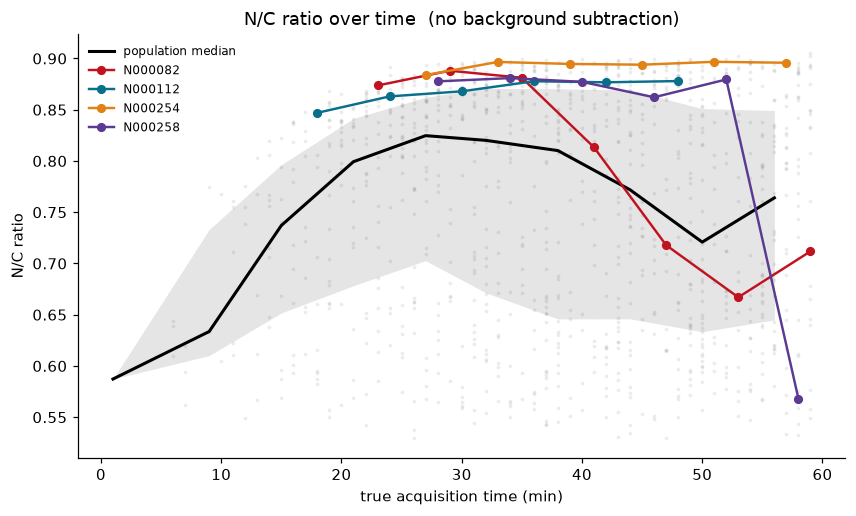

In [47]:
fig, ax = plt.subplots(figsize=(9, 5))

ax.scatter(df.time_min, df.nc_fraction, s=6, alpha=.15, color="0.5", lw=0)
q = df.groupby("time_frame").agg(t=("time_min", "median"), m=("nc_fraction", "median"),
                                 lo=("nc_fraction", lambda s: s.quantile(.25)),
                                 hi=("nc_fraction", lambda s: s.quantile(.75)))
ax.plot(q.t, q.m, "-", color="k", lw=2, label="population median")
ax.fill_between(q.t, q.lo, q.hi, color="k", alpha=.10, lw=0)
for nid in FOCAL:
    g = df_all[df_all.nucleus_id == nid].sort_values("time_min")
    ax.plot(g.time_min, g.nc_fraction, "-o", ms=5, lw=1.6, color=FC[nid], label=short(nid))

ax.set_xlabel("true acquisition time (min)")
ax.set_ylabel("N/C ratio")
ax.set_title("N/C ratio over time  (no background subtraction)")
ax.legend(frameon=False, fontsize=8)
fig.savefig(FIGDIR / "nc_ratio.png", bbox_inches="tight")

## 7 · N/C ratio and area, dual axis

One panel per focal track, so the two quantities can be read against each other
within a single nucleus. The population panel comes first for reference.

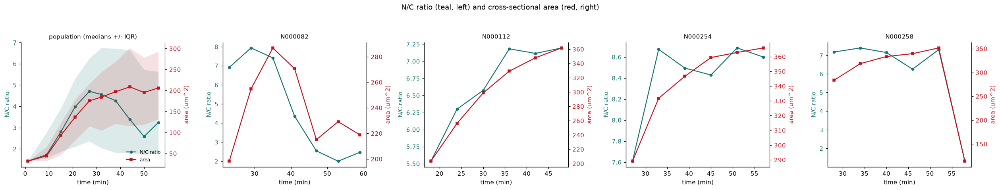

In [8]:
def dual(ax, t, nc, area, title, nc_band=None, area_band=None):
    """N/C on the left axis, area on the right, sharing a time axis."""
    ax.plot(t, nc, "-o", color="#14746f", ms=4, label="N/C ratio")
    if nc_band is not None:
        ax.fill_between(t, *nc_band, color="#14746f", alpha=.15, lw=0)
    ax.set_ylabel("N/C ratio", color="#14746f")
    ax.tick_params(axis="y", labelcolor="#14746f")
    ax.set_xlabel("time (min)")
    ax2 = ax.twinx()
    ax2.plot(t, area, "-s", color="#c1121f", ms=4, label="area")
    if area_band is not None:
        ax2.fill_between(t, *area_band, color="#c1121f", alpha=.13, lw=0)
    ax2.set_ylabel("area (um^2)", color="#c1121f")
    ax2.tick_params(axis="y", labelcolor="#c1121f")
    ax2.spines["right"].set_visible(True)
    ax.set_title(title, fontsize=10)
    return ax2


fig, axes = plt.subplots(1, N_FOCAL + 1, figsize=(4.6 * (N_FOCAL + 1), 4.4))

g = df.groupby("time_frame")
ax2 = dual(axes[0], g.time_min.median(), g.nc_ratio.median(),
           g.cross_sectional_area_um2.median(), "population (medians +/- IQR)",
           nc_band=(g.nc_ratio.quantile(.25), g.nc_ratio.quantile(.75)),
           area_band=(g.cross_sectional_area_um2.quantile(.25),
                      g.cross_sectional_area_um2.quantile(.75)))
h1, l1 = axes[0].get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
axes[0].legend(h1 + h2, l1 + l2, frameon=False, fontsize=8, loc="lower right")

for ax, nid in zip(axes[1:], FOCAL):
    t = df_all[df_all.nucleus_id == nid].sort_values("time_min")
    dual(ax, t.time_min, t.nc_ratio, t.cross_sectional_area_um2, short(nid))

fig.suptitle("N/C ratio (teal, left) and cross-sectional area (red, right)")
fig.tight_layout(rect=[0, 0, 1, .93])
fig.savefig(FIGDIR / "dual_axis.png", bbox_inches="tight")

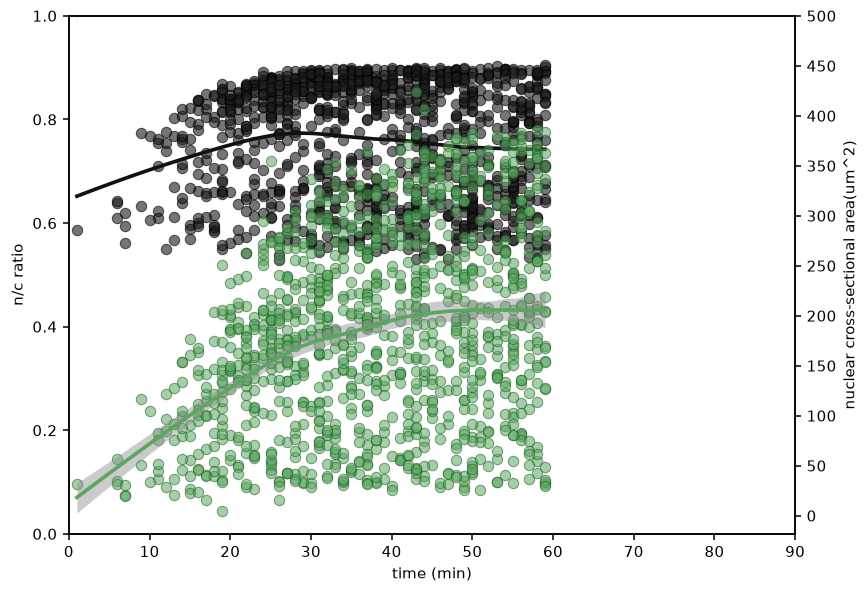

In [42]:
# Dual-axis N/C ratio and cross-sectional area, ggplot-style construction:
# semi-transparent filled circles with dark edges, a LOESS trend with a
# bootstrap confidence ribbon, boxed axes and outward ticks.
#
# LOESS is implemented here rather than imported so the cell has no dependency
# beyond numpy — it is local linear regression with tricube weights, which is
# what geom_smooth() uses by default for n < 1000.

NC_LIM    = (0,1)    # e.g. (0, 1); None = fit to the data
AREA_LIM  = None     # e.g. (0, 500)
X_LIM     = (0, 90)    # e.g. (0, 90)
SPAN      = 0.55     # LOESS smoothing span (ggplot's `span`)
N_BOOT    = 120      # bootstrap replicates for the ribbon
GRID_N    = 120      # points at which the smooth is evaluated

NC_FACE,   NC_EDGE   = "#1a1a1a", "#000000"
AREA_FACE, AREA_EDGE = "#5aa860", "#1d5c25"


def loess(x, y, xout, span=0.5):
    """Local linear regression with tricube weights — geom_smooth's default."""
    x, y = np.asarray(x, float), np.asarray(y, float)
    ok = np.isfinite(x) & np.isfinite(y)
    x, y = x[ok], y[ok]
    r = max(int(np.ceil(span * x.size)), 3)
    out = np.empty(len(xout))
    for i, x0 in enumerate(xout):
        d = np.abs(x - x0)
        idx = np.argpartition(d, r - 1)[:r]
        dmax = d[idx].max() or 1.0
        w = (1 - (d[idx] / dmax) ** 3) ** 3
        X = np.vander(x[idx] - x0, 2)          # [dx, 1]; intercept = value at x0
        sw = np.sqrt(w)
        beta, *_ = np.linalg.lstsq(sw[:, None] * X, sw * y[idx], rcond=None)
        out[i] = beta[-1]
    return out


def loess_ci(x, y, xout, span=0.5, n_boot=120, lo=2.5, hi=97.5, seed=0):
    """Bootstrap the smooth to get geom_smooth's ribbon."""
    x, y = np.asarray(x, float), np.asarray(y, float)
    ok = np.isfinite(x) & np.isfinite(y)
    x, y = x[ok], y[ok]
    rng = np.random.default_rng(seed)
    boot = np.empty((n_boot, len(xout)))
    for b in range(n_boot):
        s = rng.integers(0, x.size, x.size)
        boot[b] = loess(x[s], y[s], xout, span)
    return np.percentile(boot, lo, axis=0), np.percentile(boot, hi, axis=0)


t = df.time_min.to_numpy()
grid = np.linspace(np.nanmin(t), np.nanmax(t), GRID_N)

fig, ax = plt.subplots(figsize=(8, 5.5))
ax2 = ax.twinx()

# --- area on the right axis, drawn first so N/C sits on top ---------------
ax2.scatter(df.time_min, df.cross_sectional_area_um2, s=46, alpha=.55,
            facecolor=AREA_FACE, edgecolor=AREA_EDGE, linewidth=.7, zorder=2)
fit = loess(t, df.cross_sectional_area_um2, grid, SPAN)
lo, hi = loess_ci(t, df.cross_sectional_area_um2, grid, SPAN, N_BOOT)
ax2.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=3)
ax2.plot(grid, fit, color=AREA_FACE, lw=2.4, zorder=4)
ax2.set_yticks(np.arange(0, 501, 50))

# --- N/C on the left axis --------------------------------------------------
ax.scatter(df.time_min, df.nc_fraction, s=46, alpha=.60,
           facecolor=NC_FACE, edgecolor=NC_EDGE, linewidth=.7, zorder=5)
fit = loess(t, df.nc_fraction, grid, SPAN)
lo, hi = loess_ci(t, df.nc_ratio, grid, SPAN, N_BOOT)
ax.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=6)
ax.plot(grid, fit, color="#111111", lw=2.4, zorder=7)

ax.set_xlabel("time (min)")
ax.set_ylabel("n/c ratio")
ax2.set_ylabel("nuclear cross-sectional area(um^2)")
if NC_LIM:   ax.set_ylim(*NC_LIM)
if AREA_LIM: ax2.set_ylim(*AREA_LIM)
if X_LIM:    ax.set_xlim(*X_LIM)

# --- boxed axes, outward ticks, no grid ------------------------------------
for a_ in (ax, ax2):
    for side in ("top", "right", "bottom", "left"):
        a_.spines[side].set_visible(True)
        a_.spines[side].set_linewidth(1.0)
        a_.spines[side].set_color("black")
    a_.tick_params(direction="out", length=4, width=1.0, colors="black")
    a_.grid(False)
    a_.set_facecolor("white")
fig.patch.set_facecolor("white")

fig.tight_layout()
fig.savefig(FIGDIR / "dual_axis.png", bbox_inches="tight")

,n_before,n_after,mean_area_before,mean_area_after,% removed,area shift
time_frame,,,,,,
0,1,0.0,31.8,0.0,100.0,-31.8
1,15,4.0,52.6,94.8,73.3,42.3
2,48,26.0,90.3,119.7,45.8,29.4
3,104,70.0,131.5,158.7,32.7,27.1
4,145,106.0,168.2,197.9,26.9,29.7
5,156,100.0,181.3,227.4,35.9,46.1
6,149,92.0,189.5,237.3,38.3,47.8
7,162,100.0,206.9,265.2,38.3,58.4
8,158,79.0,200.3,274.1,50.0,73.8


NC_MIN=0.72: kept 666 of 1096 (61%)
repair-flagged fraction: 22% before -> 4% after   <- the filter is working if this drops
removed nuclei: 50% were repair-flagged
mean area shift: +38.5 um^2 actual vs +55.1 if the same number of SMALLEST nuclei were cut
  -> a shift close to the second number means the filter is mostly removing small nuclei, not bad segmentations


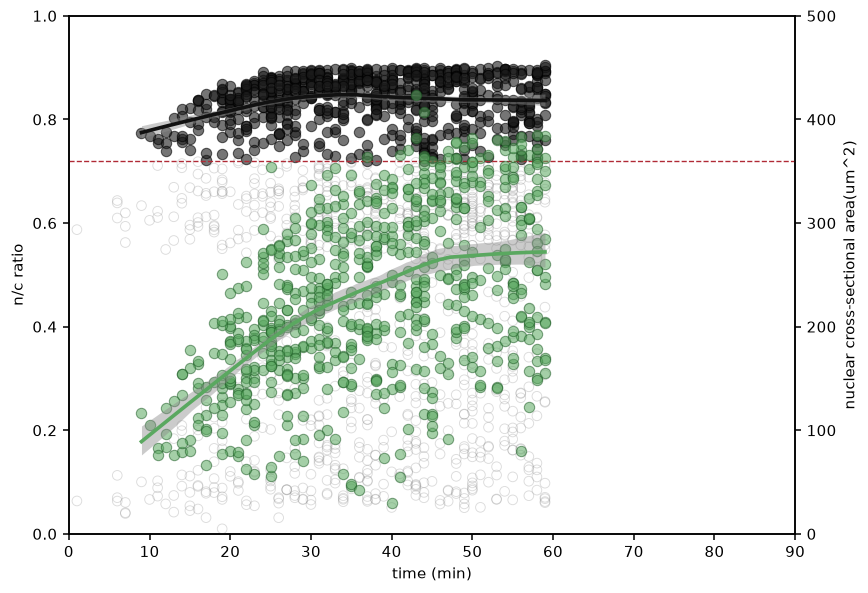

In [50]:
# Filter on N/C fraction as a segmentation-quality criterion, then redraw.
#
# Rationale, from the diagnostic: within matched area bins above ~100 um^2,
# nuclei carrying a repair flag sit 0.12-0.18 lower in N/C fraction than clean
# nuclei of the SAME size. So N/C tracks segmentation quality and not just
# nucleus size. The likely mechanism is halo placement — halos sit relative to
# the nucleus mask, so an under-segmented mask puts the "cytoplasmic" rings
# inside the envelope, contaminating cm and pulling the fraction toward 0.5.
#
# READ THIS BEFORE USING THE OUTPUT: area and N/C correlate at r = 0.80, so the
# filter removes small nuclei preferentially and mechanically raises mean area.
# Part of the increase is selection, not a better estimate. The printout
# separates the two. Below ~100 um^2 the filter cannot distinguish a fragmented
# nucleus from a genuinely small one — flagged and clean are identical there.

NC_MIN = 0.72        # trough between the two modes of the nc_fraction histogram
SHOW_REMOVED = True  # draw discarded nuclei as open grey circles

d = df.copy()
d["flagged"] = d.zstack_consistency.isin(["area_mismatch", "plane_missing"])
keep = d.nc_fraction >= NC_MIN
dft, drop = d[keep], d[~keep]

rep = pd.DataFrame({
    "n_before": d.groupby("time_frame").size(),
    "n_after": dft.groupby("time_frame").size(),
    "mean_area_before": d.groupby("time_frame").cross_sectional_area_um2.mean(),
    "mean_area_after": dft.groupby("time_frame").cross_sectional_area_um2.mean(),
}).fillna(0)
rep["% removed"] = (100 * (rep.n_before - rep.n_after) / rep.n_before).round(1)
rep["area shift"] = (rep.mean_area_after - rep.mean_area_before).round(1)
display(rep.round(1))

print(f"NC_MIN={NC_MIN}: kept {len(dft)} of {len(d)} ({100*len(dft)/len(d):.0f}%)")
print(f"repair-flagged fraction: {100*d.flagged.mean():.0f}% before -> "
      f"{100*dft.flagged.mean():.0f}% after   <- the filter is working if this drops")
print(f"removed nuclei: {100*drop.flagged.mean():.0f}% were repair-flagged")
mech = []
for t, g in d.groupby("time_frame"):
    n_cut = int((~keep[g.index]).sum())
    if n_cut < len(g):
        mech.append(g.cross_sectional_area_um2.nlargest(len(g) - n_cut).mean()
                    - g.cross_sectional_area_um2.mean())
print(f"mean area shift: {rep['area shift'].mean():+.1f} um^2 actual vs "
      f"{np.mean(mech):+.1f} if the same number of SMALLEST nuclei were cut")
print("  -> a shift close to the second number means the filter is mostly "
      "removing small nuclei, not bad segmentations")

# ---------------------------------------------------------------------------
NC_LIM, AREA_LIM, X_LIM = (0, 1), (0, 500), (0, 90)
SPAN, N_BOOT, GRID_N = 0.55, 120, 120
NC_FACE, NC_EDGE     = "#1a1a1a", "#000000"
AREA_FACE, AREA_EDGE = "#5aa860", "#1d5c25"

t = dft.time_min.to_numpy()
grid = np.linspace(np.nanmin(t), np.nanmax(t), GRID_N)

fig, ax = plt.subplots(figsize=(8, 5.5))
ax2 = ax.twinx()

if SHOW_REMOVED:
    ax2.scatter(drop.time_min, drop.cross_sectional_area_um2, s=40, alpha=.30,
                facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)
    ax.scatter(drop.time_min, drop.nc_fraction, s=40, alpha=.30,
               facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)

ax2.scatter(dft.time_min, dft.cross_sectional_area_um2, s=46, alpha=.55,
            facecolor=AREA_FACE, edgecolor=AREA_EDGE, linewidth=.7, zorder=2)
fit = loess(t, dft.cross_sectional_area_um2, grid, SPAN)
lo, hi = loess_ci(t, dft.cross_sectional_area_um2, grid, SPAN, N_BOOT)
ax2.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=3)
ax2.plot(grid, fit, color=AREA_FACE, lw=2.4, zorder=4)

ax.scatter(dft.time_min, dft.nc_fraction, s=46, alpha=.60,
           facecolor=NC_FACE, edgecolor=NC_EDGE, linewidth=.7, zorder=5)
fit = loess(t, dft.nc_fraction, grid, SPAN)
lo, hi = loess_ci(t, dft.nc_fraction, grid, SPAN, N_BOOT)
ax.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=6)
ax.plot(grid, fit, color="#111111", lw=2.4, zorder=7)

ax.axhline(NC_MIN, color="#b02a35", lw=.9, ls="--", zorder=8)
ax.set_xlabel("time (min)")
ax.set_ylabel("n/c ratio")
ax2.set_ylabel("nuclear cross-sectional area(um^2)")
ax.set_ylim(*NC_LIM); ax2.set_ylim(*AREA_LIM); ax.set_xlim(*X_LIM)

for a_ in (ax, ax2):
    for side in ("top", "right", "bottom", "left"):
        a_.spines[side].set_visible(True)
        a_.spines[side].set_linewidth(1.0); a_.spines[side].set_color("black")
    a_.tick_params(direction="out", length=4, width=1.0, colors="black")
    a_.grid(False); a_.set_facecolor("white")
fig.patch.set_facecolor("white")

fig.tight_layout()
fig.savefig(FIGDIR / f"dual_axis_ncfilter_{NC_MIN:g}.png", bbox_inches="tight")

residual MAD = 0.1056


,n_before,n_after,threshold,mean_area_before,mean_area_after,% removed
time_frame,,,,,,
0,1,1,0.587,31.767,31.767,0.0
1,15,15,0.562,52.561,52.561,0.0
2,48,46,0.566,90.271,92.979,4.2
3,104,93,0.593,131.544,142.411,10.6
4,145,129,0.631,168.187,182.904,11.0
5,156,126,0.633,181.329,208.096,19.2
6,149,123,0.620,189.517,214.153,17.4
7,162,141,0.611,206.853,228.240,13.0
8,158,138,0.595,200.278,220.767,12.7


residual: kept 952 of 1096 (87%)
repair-flagged: 22% before -> 20% after
removed nuclei were 36% repair-flagged (chance would be 22%)


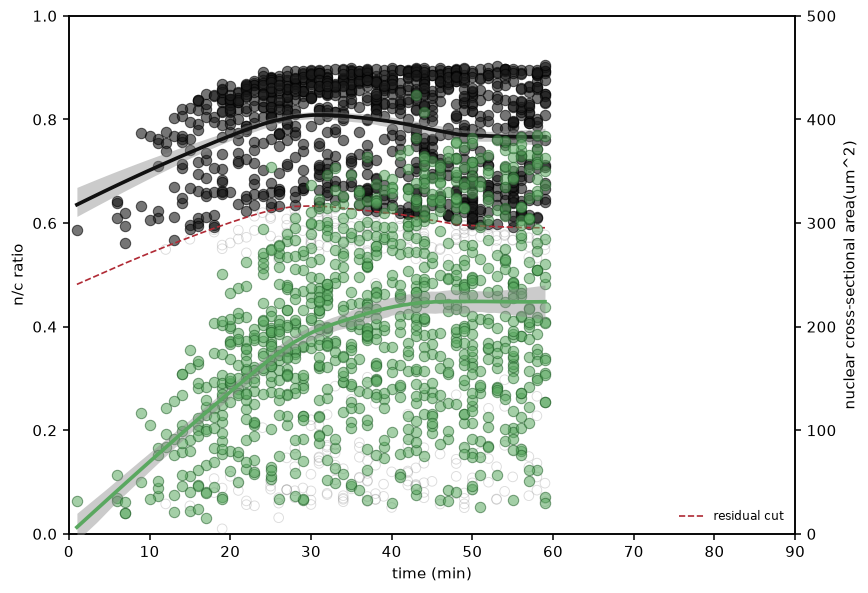

In [55]:
# Time-aware N/C quality filter.
#
# A fixed N/C cut is biologically wrong: import is still running early, so a
# nucleus at t=1 legitimately reads lower than one at t=8. A fixed 0.72 cut
# removed 73% of t=1 and 46% of t=2 — that is deleting real early nuclei, not
# bad segmentations. Both modes below judge a nucleus against its OWN timepoint.
#
# MODE:
#   "quantile" drop the lowest Q_CUT fraction of nc_fraction WITHIN each
#              timepoint. Removal is even across time by construction, and the
#              data cost is exactly Q_CUT. This is the one I would use.
#   "residual" fit the population import curve by robust LOESS and drop nuclei
#              more than K_MAD below it. More principled in form, but the
#              residual MAD here is 0.123 — the spread around the curve is so
#              wide that k=2 removes nothing. Kept for the sensitivity check.
#
# Neither improves TARGETING over a fixed cut: at matched keep-fraction, ~49%
# of removed nuclei carry a repair flag either way. What time-awareness fixes
# is which nuclei pay the cost.

MODE   = "residual"     # "quantile" | "residual"
Q_CUT  = 0.25           # quantile mode: fraction dropped per timepoint
K_MAD  = 1.5          # residual mode: MADs below the import curve
SHOW_REMOVED = True

d = df.copy()
d["flagged"] = d.zstack_consistency.isin(["area_mismatch", "plane_missing"])

if MODE == "quantile":
    thr = d.groupby("time_frame").nc_fraction.transform(lambda s: s.quantile(Q_CUT))
    keep = d.nc_fraction >= thr
    curve = d.groupby("time_frame").agg(t=("time_min", "median")).assign(
        thr=d.groupby("time_frame").nc_fraction.quantile(Q_CUT))
else:
    tt, yy = d.time_min.to_numpy(), d.nc_fraction.to_numpy()
    w = np.ones(len(d), bool)
    for _ in range(2):                       # reweight so bad nuclei don't drag the fit
        fitted = loess(tt[w], yy[w], tt, 0.55)
        res = yy - fitted
        mad = 1.4826 * np.median(np.abs(res[w] - np.median(res[w])))
        w = res >= -K_MAD * mad
    keep = pd.Series(w, index=d.index)
    curve = pd.DataFrame({"t": tt, "thr": fitted - K_MAD * mad}).sort_values("t")
    print(f"residual MAD = {mad:.4f}")

dft, drop = d[keep], d[~keep]

rep = pd.DataFrame({
    "n_before": d.groupby("time_frame").size(),
    "n_after": dft.groupby("time_frame").size(),
    "threshold": d.assign(k=keep).groupby("time_frame").apply(
        lambda g: g.loc[g.k, "nc_fraction"].min() if g.k.any() else np.nan),
    "mean_area_before": d.groupby("time_frame").cross_sectional_area_um2.mean(),
    "mean_area_after": dft.groupby("time_frame").cross_sectional_area_um2.mean(),
}).fillna(0)
rep["% removed"] = (100 * (rep.n_before - rep.n_after) / rep.n_before).round(1)
display(rep.round(3))

print(f"{MODE}: kept {len(dft)} of {len(d)} ({100*len(dft)/len(d):.0f}%)")
print(f"repair-flagged: {100*d.flagged.mean():.0f}% before -> {100*dft.flagged.mean():.0f}% after")
print(f"removed nuclei were {100*drop.flagged.mean():.0f}% repair-flagged "
      f"(chance would be {100*d.flagged.mean():.0f}%)")

# ---------------------------------------------------------------------------
NC_LIM, AREA_LIM, X_LIM = (0, 1), (0, 500), (0, 90)
SPAN, N_BOOT, GRID_N = 0.55, 120, 120
NC_FACE, NC_EDGE     = "#1a1a1a", "#000000"
AREA_FACE, AREA_EDGE = "#5aa860", "#1d5c25"

t = dft.time_min.to_numpy()
grid = np.linspace(np.nanmin(t), np.nanmax(t), GRID_N)

fig, ax = plt.subplots(figsize=(8, 5.5))
ax2 = ax.twinx()

if SHOW_REMOVED:
    ax2.scatter(drop.time_min, drop.cross_sectional_area_um2, s=40, alpha=.30,
                facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)
    ax.scatter(drop.time_min, drop.nc_fraction, s=40, alpha=.30,
               facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)

ax2.scatter(dft.time_min, dft.cross_sectional_area_um2, s=46, alpha=.55,
            facecolor=AREA_FACE, edgecolor=AREA_EDGE, linewidth=.7, zorder=2)
fit = loess(t, dft.cross_sectional_area_um2, grid, SPAN)
lo, hi = loess_ci(t, dft.cross_sectional_area_um2, grid, SPAN, N_BOOT)
ax2.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=3)
ax2.plot(grid, fit, color=AREA_FACE, lw=2.4, zorder=4)

ax.scatter(dft.time_min, dft.nc_fraction, s=46, alpha=.60,
           facecolor=NC_FACE, edgecolor=NC_EDGE, linewidth=.7, zorder=5)
fit = loess(t, dft.nc_fraction, grid, SPAN)
lo, hi = loess_ci(t, dft.nc_fraction, grid, SPAN, N_BOOT)
ax.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=6)
ax.plot(grid, fit, color="#111111", lw=2.4, zorder=7)

# the cut itself, so the reader can see it follows the import curve
ax.plot(curve["t"], curve["thr"], color="#b02a35", lw=1.1, ls="--", zorder=8,
        label=f"{MODE} cut")
ax.legend(frameon=False, fontsize=8, loc="lower right")

ax.set_xlabel("time (min)")
ax.set_ylabel("n/c ratio")
ax2.set_ylabel("nuclear cross-sectional area(um^2)")
ax.set_ylim(*NC_LIM); ax2.set_ylim(*AREA_LIM); ax.set_xlim(*X_LIM)

for a_ in (ax, ax2):
    for side in ("top", "right", "bottom", "left"):
        a_.spines[side].set_visible(True)
        a_.spines[side].set_linewidth(1.0); a_.spines[side].set_color("black")
    a_.tick_params(direction="out", length=4, width=1.0, colors="black")
    a_.grid(False); a_.set_facecolor("white")
fig.patch.set_facecolor("white")

fig.tight_layout()
fig.savefig(FIGDIR / f"dual_axis_ncfilter_{MODE}.png", bbox_inches="tight")

,n_before,n_after,curve,threshold,mean_area_before,mean_area_after,% removed
time_frame,,,,,,,
0,1,1,0.640,0.540,31.767,31.767,0.0
1,15,14,0.694,0.594,52.561,54.855,6.7
2,48,38,0.731,0.631,90.271,105.102,20.8
3,104,84,0.765,0.665,131.544,148.756,19.2
4,145,111,0.788,0.688,168.187,196.777,23.4
5,156,112,0.790,0.690,181.329,217.268,28.2
6,149,98,0.781,0.681,189.517,233.979,34.2
7,162,114,0.767,0.667,206.853,252.089,29.6
8,158,106,0.754,0.654,200.278,250.674,32.9


offset: kept 793 of 1096 (72%)
repair-flagged: 22% before -> 11% after
removed nuclei were 50% repair-flagged (chance would be 22%)


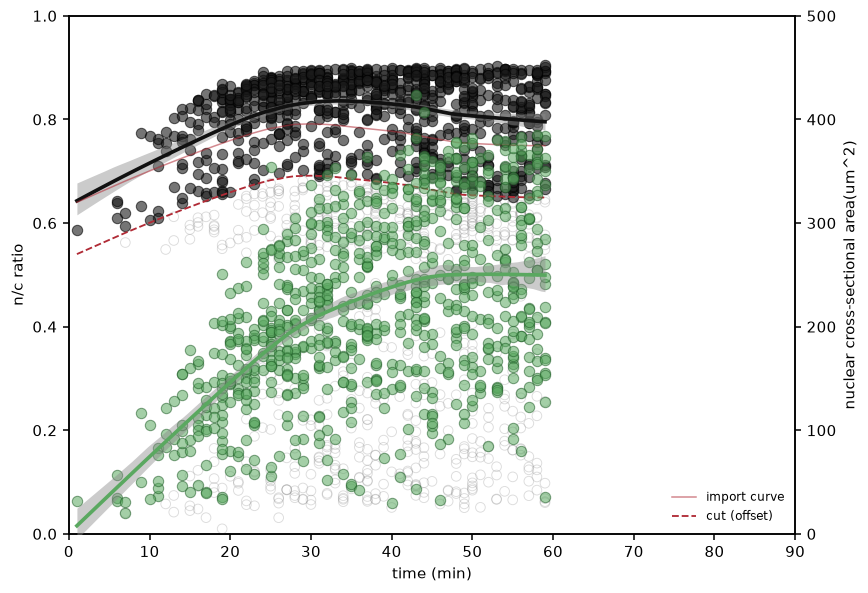

In [56]:
# Time-aware N/C quality filter — absolute threshold that follows the import curve.
#
# A fixed cut is biologically wrong: import is still running early, so a nucleus
# at t=1 legitimately reads lower than one at t=8. Here the threshold is the
# population's own import trajectory, offset downward — "is this nucleus low FOR
# ITS TIMEPOINT", not "is this nucleus low".
#
# The centre is a robust LOESS fit (two reweighting passes) rather than per-frame
# medians, which are noisy where n is small — t=0 has one nucleus and t=1 has 15.
#
# MODE:
#   "offset" threshold = curve(t) - OFFSET. A fixed absolute distance below the
#            import curve. Best targeting of everything tested: 50% of removals
#            carry a repair flag against 22% chance.
#   "mad"    threshold = curve(t) - K_MAD * MAD(t), scaled by each timepoint's
#            own spread. Adaptive in principle, but the spread GROWS over time
#            (MAD 0.042 at t=1 to 0.164 at t=8) largely BECAUSE of bad
#            segmentations, so this becomes more permissive exactly where the
#            problem is worst. Included for comparison; I would not use it.
#
# Unlike a fixed-quantile cut, the number removed per frame is set by the data
# (7% at t=1, 34% at t=6), not forced to a constant.

MODE   = "offset"     # "offset" | "mad"
OFFSET = 0.10         # offset mode: absolute distance below the import curve
K_MAD  = 1.0          # mad mode: per-timepoint MADs below it
SPAN   = 0.55
SHOW_REMOVED = True

d = df.copy()
d["flagged"] = d.zstack_consistency.isin(["area_mismatch", "plane_missing"])
tt, yy = d.time_min.to_numpy(), d.nc_fraction.to_numpy()

# Robust import curve: fit, downweight low outliers, refit — so the nuclei we
# are about to reject do not drag the centre down with them.
w = np.ones(len(d), bool)
for _ in range(2):
    curve = loess(tt[w], yy[w], tt, SPAN)
    res = yy - curve
    mad_glob = 1.4826 * np.median(np.abs(res[w] - np.median(res[w])))
    w = res >= -1.5 * mad_glob

if MODE == "offset":
    thresh = curve - OFFSET
else:
    mad_t = d.groupby("time_frame").nc_fraction.transform(
        lambda s: 1.4826 * (s - s.median()).abs().median()).to_numpy()
    thresh = curve - K_MAD * mad_t

keep = pd.Series(yy >= thresh, index=d.index)
dft, drop = d[keep], d[~keep]

rep = pd.DataFrame({
    "n_before": d.groupby("time_frame").size(),
    "n_after": dft.groupby("time_frame").size(),
    "curve": pd.Series(curve, index=d.index).groupby(d.time_frame).median(),
    "threshold": pd.Series(thresh, index=d.index).groupby(d.time_frame).median(),
    "mean_area_before": d.groupby("time_frame").cross_sectional_area_um2.mean(),
    "mean_area_after": dft.groupby("time_frame").cross_sectional_area_um2.mean(),
}).fillna(0)
rep["% removed"] = (100 * (rep.n_before - rep.n_after) / rep.n_before).round(1)
display(rep.round(3))

print(f"{MODE}: kept {len(dft)} of {len(d)} ({100*len(dft)/len(d):.0f}%)")
print(f"repair-flagged: {100*d.flagged.mean():.0f}% before -> {100*dft.flagged.mean():.0f}% after")
print(f"removed nuclei were {100*drop.flagged.mean():.0f}% repair-flagged "
      f"(chance would be {100*d.flagged.mean():.0f}%)")

# ---------------------------------------------------------------------------
NC_LIM, AREA_LIM, X_LIM = (0, 1), (0, 500), (0, 90)
N_BOOT, GRID_N = 120, 120
NC_FACE, NC_EDGE     = "#1a1a1a", "#000000"
AREA_FACE, AREA_EDGE = "#5aa860", "#1d5c25"

t = dft.time_min.to_numpy()
grid = np.linspace(np.nanmin(t), np.nanmax(t), GRID_N)

fig, ax = plt.subplots(figsize=(8, 5.5))
ax2 = ax.twinx()

if SHOW_REMOVED:
    ax2.scatter(drop.time_min, drop.cross_sectional_area_um2, s=40, alpha=.30,
                facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)
    ax.scatter(drop.time_min, drop.nc_fraction, s=40, alpha=.30,
               facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)

ax2.scatter(dft.time_min, dft.cross_sectional_area_um2, s=46, alpha=.55,
            facecolor=AREA_FACE, edgecolor=AREA_EDGE, linewidth=.7, zorder=2)
fit = loess(t, dft.cross_sectional_area_um2, grid, SPAN)
lo, hi = loess_ci(t, dft.cross_sectional_area_um2, grid, SPAN, N_BOOT)
ax2.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=3)
ax2.plot(grid, fit, color=AREA_FACE, lw=2.4, zorder=4)

ax.scatter(dft.time_min, dft.nc_fraction, s=46, alpha=.60,
           facecolor=NC_FACE, edgecolor=NC_EDGE, linewidth=.7, zorder=5)
fit = loess(t, dft.nc_fraction, grid, SPAN)
lo, hi = loess_ci(t, dft.nc_fraction, grid, SPAN, N_BOOT)
ax.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=6)
ax.plot(grid, fit, color="#111111", lw=2.4, zorder=7)

# the import curve and the cut that follows it
o = np.argsort(tt)
ax.plot(tt[o], curve[o], color="#b02a35", lw=1.0, alpha=.55, zorder=8,
        label="import curve")
ax.plot(tt[o], thresh[o], color="#b02a35", lw=1.2, ls="--", zorder=8,
        label=f"cut ({MODE})")
ax.legend(frameon=False, fontsize=8, loc="lower right")

ax.set_xlabel("time (min)")
ax.set_ylabel("n/c ratio")
ax2.set_ylabel("nuclear cross-sectional area(um^2)")
ax.set_ylim(*NC_LIM); ax2.set_ylim(*AREA_LIM); ax.set_xlim(*X_LIM)

for a_ in (ax, ax2):
    for side in ("top", "right", "bottom", "left"):
        a_.spines[side].set_visible(True)
        a_.spines[side].set_linewidth(1.0); a_.spines[side].set_color("black")
    a_.tick_params(direction="out", length=4, width=1.0, colors="black")
    a_.grid(False); a_.set_facecolor("white")
fig.patch.set_facecolor("white")

fig.tight_layout()
fig.savefig(FIGDIR / f"dual_axis_ncfilter_timeaware_{MODE}.png", bbox_inches="tight")

import fit: plateau=0.790  k=0.265  T-half=8.8 min
  published mCherry-NLS T-half = 8.4 +/- 0.6 min


,n_before,n_after,curve,threshold,mean_area_before,mean_area_after,% removed
time_frame,,,,,,,
0,1,1,0.532,0.432,31.767,31.767,0.0
1,15,15,0.648,0.548,52.561,52.561,0.0
2,48,36,0.743,0.643,90.271,108.722,25.0
3,104,78,0.779,0.679,131.544,154.209,25.0
4,145,111,0.788,0.688,168.187,196.777,23.4
5,156,112,0.789,0.689,181.329,217.268,28.2
6,149,96,0.790,0.690,189.517,235.440,35.6
7,162,112,0.790,0.690,206.853,252.568,30.9
8,158,87,0.790,0.690,200.278,266.908,44.9


kept 746 of 1096 (68%)
repair-flagged: 22% before -> 8% after
removed were 52% flagged (chance 22%)
refit on retained nuclei: plateau=0.832  T-half=9.1 min


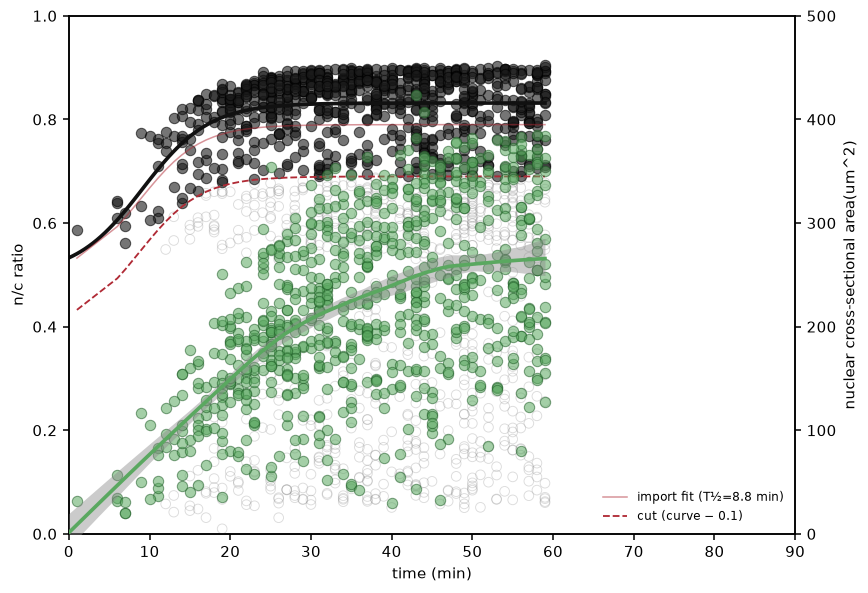

In [58]:
# Time-aware N/C filter, threshold = fitted import curve minus an offset.
#
# WHY A SIGMOID, NOT LOESS: nuclear import of mCherry-NLS is a steep sigmoid
# (published T-half = 8.4 +/- 0.6 min). LOESS with span=0.55 fits each point
# from 55% of the data, which flattens that rise into a ramp and puts the early
# threshold far too high — it was deleting real, still-importing nuclei.
# Fitting the actual functional form recovers T-half = 8.8 min here.
#
# The baseline is FIXED at 0.5, not fitted. N/(N+C) = 0.5 is the physical
# no-enrichment point, so it is known rather than estimated.
#
# The fit is iterated three times, discarding points more than 1.5 MAD below
# the curve each pass, so the nuclei being rejected do not drag the plateau
# down with them (plateau moves 0.760 -> 0.790 across the iterations).
#
# NOTE: aligning each nucleus to its own first detection does NOT sharpen this.
# Median N/C fraction at first detection is already 0.834 — segmentation finds
# a nucleus only after import is largely complete, so the rise happens before
# anything is detectable and cannot be recovered from the tracks.

from scipy.optimize import curve_fit

OFFSET = 0.10        # absolute distance below the fitted import curve
N_ITER = 3           # robust reweighting passes
SHOW_REMOVED = True


def import_sigmoid(t, plateau, k, t_half):
    """N/(N+C) import curve. Baseline fixed at 0.5 = no nuclear enrichment."""
    return 0.5 + (plateau - 0.5) / (1 + np.exp(-k * (t - t_half)))


d = df.copy()
d["flagged"] = d.zstack_consistency.isin(["area_mismatch", "plane_missing"])
tt, yy = d.time_min.to_numpy(), d.nc_fraction.to_numpy()

w, p = np.ones(len(d), bool), [0.9, 0.3, 10.0]
for _ in range(N_ITER):
    p, _ = curve_fit(import_sigmoid, tt[w], yy[w], p0=p, maxfev=40000)
    resid = yy - import_sigmoid(tt, *p)
    mad = 1.4826 * np.median(np.abs(resid[w] - np.median(resid[w])))
    w = resid >= -1.5 * mad
plateau, k, t_half = p
print(f"import fit: plateau={plateau:.3f}  k={k:.3f}  T-half={t_half:.1f} min")
print(f"  published mCherry-NLS T-half = 8.4 +/- 0.6 min")

curve  = import_sigmoid(tt, *p)
thresh = curve - OFFSET
keep = pd.Series(yy >= thresh, index=d.index)
dft, drop = d[keep], d[~keep]

rep = pd.DataFrame({
    "n_before": d.groupby("time_frame").size(),
    "n_after": dft.groupby("time_frame").size(),
    "curve": pd.Series(curve, index=d.index).groupby(d.time_frame).median(),
    "threshold": pd.Series(thresh, index=d.index).groupby(d.time_frame).median(),
    "mean_area_before": d.groupby("time_frame").cross_sectional_area_um2.mean(),
    "mean_area_after": dft.groupby("time_frame").cross_sectional_area_um2.mean(),
}).fillna(0)
rep["% removed"] = (100 * (rep.n_before - rep.n_after) / rep.n_before).round(1)
display(rep.round(3))

print(f"kept {len(dft)} of {len(d)} ({100*len(dft)/len(d):.0f}%)")
print(f"repair-flagged: {100*d.flagged.mean():.0f}% before -> {100*dft.flagged.mean():.0f}% after")
print(f"removed were {100*drop.flagged.mean():.0f}% flagged (chance {100*d.flagged.mean():.0f}%)")

# ---------------------------------------------------------------------------
NC_LIM, AREA_LIM, X_LIM = (0, 1), (0, 500), (0, 90)
SPAN, N_BOOT, GRID_N = 0.55, 120, 120
NC_FACE, NC_EDGE     = "#1a1a1a", "#000000"
AREA_FACE, AREA_EDGE = "#5aa860", "#1d5c25"

t = dft.time_min.to_numpy()
grid = np.linspace(0, np.nanmax(tt), GRID_N)

fig, ax = plt.subplots(figsize=(8, 5.5))
ax2 = ax.twinx()

if SHOW_REMOVED:
    ax2.scatter(drop.time_min, drop.cross_sectional_area_um2, s=40, alpha=.30,
                facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)
    ax.scatter(drop.time_min, drop.nc_fraction, s=40, alpha=.30,
               facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)

# area keeps LOESS — there is no known functional form for nuclear growth here
ax2.scatter(dft.time_min, dft.cross_sectional_area_um2, s=46, alpha=.55,
            facecolor=AREA_FACE, edgecolor=AREA_EDGE, linewidth=.7, zorder=2)
fit = loess(t, dft.cross_sectional_area_um2, grid, SPAN)
lo, hi = loess_ci(t, dft.cross_sectional_area_um2, grid, SPAN, N_BOOT)
ax2.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=3)
ax2.plot(grid, fit, color=AREA_FACE, lw=2.4, zorder=4)

# N/C uses the sigmoid, refitted on the retained nuclei
ax.scatter(dft.time_min, dft.nc_fraction, s=46, alpha=.60,
           facecolor=NC_FACE, edgecolor=NC_EDGE, linewidth=.7, zorder=5)
p2, _ = curve_fit(import_sigmoid, t, dft.nc_fraction.to_numpy(), p0=p, maxfev=40000)
ax.plot(grid, import_sigmoid(grid, *p2), color="#111111", lw=2.4, zorder=7)
print(f"refit on retained nuclei: plateau={p2[0]:.3f}  T-half={p2[2]:.1f} min")

o = np.argsort(tt)
ax.plot(tt[o], curve[o], color="#b02a35", lw=1.0, alpha=.5, zorder=8,
        label=f"import fit (T½={t_half:.1f} min)")
ax.plot(tt[o], thresh[o], color="#b02a35", lw=1.2, ls="--", zorder=8,
        label=f"cut (curve − {OFFSET})")
ax.legend(frameon=False, fontsize=8, loc="lower right")

ax.set_xlabel("time (min)")
ax.set_ylabel("n/c ratio")
ax2.set_ylabel("nuclear cross-sectional area(um^2)")
ax.set_ylim(*NC_LIM); ax2.set_ylim(*AREA_LIM); ax.set_xlim(*X_LIM)

for a_ in (ax, ax2):
    for side in ("top", "right", "bottom", "left"):
        a_.spines[side].set_visible(True)
        a_.spines[side].set_linewidth(1.0); a_.spines[side].set_color("black")
    a_.tick_params(direction="out", length=4, width=1.0, colors="black")
    a_.grid(False); a_.set_facecolor("white")
fig.patch.set_facecolor("white")

fig.tight_layout()
fig.savefig(FIGDIR / "dual_axis_ncfilter_sigmoid.png", bbox_inches="tight")

import fit: plateau=0.790  T-half=8.8 min  (published mCherry-NLS T-half = 8.4 +/- 0.6)

how often each signature fires:


,fires,% of nuclei,median area when firing,median area when not
sig_import,350,31.9,82.9,213.2
sig_repair,242,22.1,106.6,197.9
sig_persist,464,42.3,141.7,202.9



nuclei by number of signatures:


,n,median_area,median_nc,median_track_len
n_signatures,,,,
0,432,242.409,0.855,2.0
1,365,160.576,0.787,1.0
2,206,89.702,0.627,1.0
3,93,82.123,0.623,1.0


,n_before,n_after,mean_area_before,mean_area_after,% removed
time_frame,,,,,
0,1,1,31.8,31.8,0.0
1,15,13,52.6,55.4,13.3
2,48,32,90.3,114.3,33.3
3,104,78,131.5,152.1,25.0
4,145,117,168.2,189.7,19.3
5,156,113,181.3,213.9,27.6
6,149,104,189.5,222.6,30.2
7,162,121,206.9,238.9,25.3
8,158,95,200.3,252.6,39.9


MIN_SIGNATURES=2: kept 797 of 1096 (73%)

sub-200 um^2 after 30 min: 398 nuclei, 50% removed
200+ um^2 after 30 min:    385 nuclei, 7% removed   <- should be much lower
refit on retained nuclei: plateau=0.809  T-half=8.3 min

borderline (kept, but 1 signature fired, small and late): 116


,nucleus_id,time_frame,cross_sectional_area_um2,nc_fraction,n_signatures,sig_import,sig_repair,sig_persist
139,control_extract_1.1|FOV01|N000110,6,180.433906,0.654168,1,True,False,False
140,control_extract_1.1|FOV01|N000110,7,173.911563,0.634887,1,True,False,False
207,control_extract_1.1|FOV01|N000155,5,142.567344,0.628438,1,True,False,False
208,control_extract_1.1|FOV01|N000155,6,47.980156,0.551210,1,True,False,False
232,control_extract_1.1|FOV01|N000175,6,129.813125,0.645938,1,True,False,False
236,control_extract_1.1|FOV01|N000178,6,54.660938,0.616140,1,True,False,False
245,control_extract_1.1|FOV01|N000186,5,43.411875,0.593213,1,True,False,False
262,control_extract_1.1|FOV01|N000199,6,57.935313,0.619934,1,True,False,False
357,control_extract_1.1|FOV01|N000258,9,113.942969,0.568069,1,True,False,False
360,control_extract_1.1|FOV01|N000260,5,129.813125,0.568053,1,True,False,False


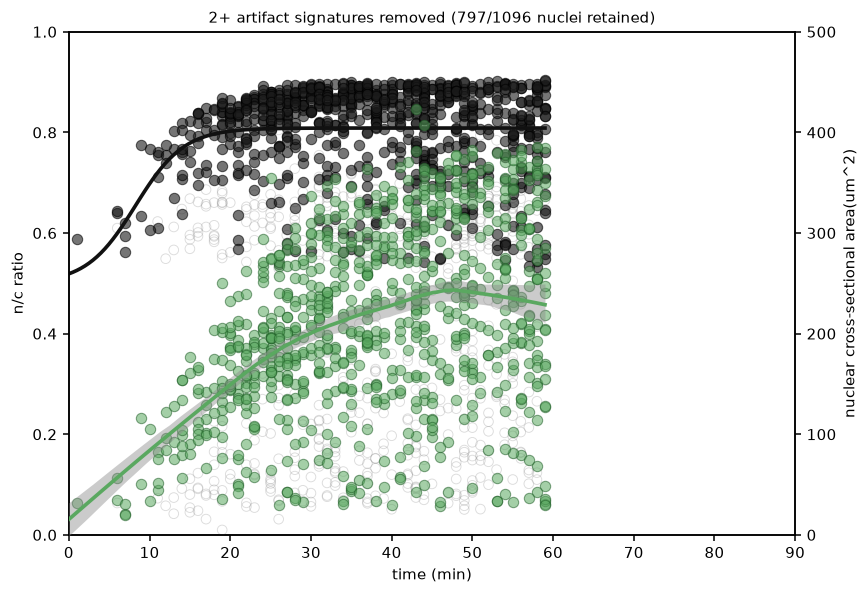

In [59]:
# Combined segmentation-artifact filter.
#
# Three signatures, each measured independently of nucleus area, so combining
# them does not select on the variable being measured:
#
#   1. IMPORT   nc_fraction below the fitted import curve minus OFFSET. An
#               under-segmented mask puts the "cytoplasmic" halos inside the
#               envelope, contaminating cm and pulling N/(N+C) toward 0.5.
#   2. REPAIR   zstack_consistency shows the fragmentation repair touched this
#               row (area_mismatch or plane_missing).
#   3. PERSIST  the track is seen in only one frame. A real nucleus persists;
#               a spurious detection does not.
#
# MIN_SIGNATURES sets how many must fire before a nucleus is dropped. 1 is
# aggressive, 2 is the balanced default, 3 removes only the clearest cases.
#
# NOTE ON PERSISTENCE: unavailable at the last frame and unreliable at the
# first, since a nucleus cannot be seen again after imaging stops. Frames in
# EDGE_FRAMES are exempted from it.

OFFSET         = 0.10
MIN_SIGNATURES = 2
EDGE_FRAMES    = None      # None = auto (first and last frame present)
SHOW_REMOVED   = True

from scipy.optimize import curve_fit


def import_sigmoid(t, plateau, k, t_half):
    """N/(N+C) import curve. Baseline fixed at 0.5 = no nuclear enrichment."""
    return 0.5 + (plateau - 0.5) / (1 + np.exp(-k * (t - t_half)))


d = df.copy()
tt, yy = d.time_min.to_numpy(), d.nc_fraction.to_numpy()

w, p = np.ones(len(d), bool), [0.9, 0.3, 10.0]
for _ in range(3):
    p, _ = curve_fit(import_sigmoid, tt[w], yy[w], p0=p, maxfev=40000)
    resid = yy - import_sigmoid(tt, *p)
    mad = 1.4826 * np.median(np.abs(resid[w] - np.median(resid[w])))
    w = resid >= -1.5 * mad
curve = import_sigmoid(tt, *p)
print(f"import fit: plateau={p[0]:.3f}  T-half={p[2]:.1f} min  "
      f"(published mCherry-NLS T-half = 8.4 +/- 0.6)")

if EDGE_FRAMES is None:
    EDGE_FRAMES = {d.time_frame.min(), d.time_frame.max()}

d["sig_import"]  = yy < curve - OFFSET
d["sig_repair"]  = d.zstack_consistency.isin(["area_mismatch", "plane_missing"])
d["sig_persist"] = ((d.groupby("nucleus_id").nucleus_id.transform("size") == 1)
                    & ~d.time_frame.isin(EDGE_FRAMES))
SIGS = ["sig_import", "sig_repair", "sig_persist"]
d["n_signatures"] = d[SIGS].sum(axis=1)

keep = d.n_signatures < MIN_SIGNATURES
dft, drop = d[keep], d[~keep]

print("\nhow often each signature fires:")
display(pd.DataFrame({
    "fires": d[SIGS].sum(),
    "% of nuclei": (100 * d[SIGS].mean()).round(1),
    "median area when firing": [d.loc[d[s], "cross_sectional_area_um2"].median().round(1)
                                for s in SIGS],
    "median area when not": [d.loc[~d[s], "cross_sectional_area_um2"].median().round(1)
                             for s in SIGS]}))

print("\nnuclei by number of signatures:")
display(d.groupby("n_signatures").agg(
    n=("nucleus_id", "size"),
    median_area=("cross_sectional_area_um2", "median"),
    median_nc=("nc_fraction", "median"),
    median_track_len=("nucleus_id", lambda s: d.loc[s.index].groupby(
        "nucleus_id").size().median())).round(3))

rep = pd.DataFrame({
    "n_before": d.groupby("time_frame").size(),
    "n_after": dft.groupby("time_frame").size(),
    "mean_area_before": d.groupby("time_frame").cross_sectional_area_um2.mean(),
    "mean_area_after": dft.groupby("time_frame").cross_sectional_area_um2.mean(),
}).fillna(0)
rep["% removed"] = (100 * (rep.n_before - rep.n_after) / rep.n_before).round(1)
display(rep.round(1))
print(f"MIN_SIGNATURES={MIN_SIGNATURES}: kept {len(dft)} of {len(d)} "
      f"({100*len(dft)/len(d):.0f}%)")

# does it do what it was built to do?
late = d[d.time_min >= 30]
late_small = late[late.cross_sectional_area_um2 < 200]
print(f"\nsub-200 um^2 after 30 min: {len(late_small)} nuclei, "
      f"{100*(~keep[late_small.index]).mean():.0f}% removed")
late_big = late[late.cross_sectional_area_um2 >= 200]
print(f"200+ um^2 after 30 min:    {len(late_big)} nuclei, "
      f"{100*(~keep[late_big.index]).mean():.0f}% removed   <- should be much lower")

# ---------------------------------------------------------------------------
NC_LIM, AREA_LIM, X_LIM = (0, 1), (0, 500), (0, 90)
SPAN, N_BOOT, GRID_N = 0.55, 120, 120
NC_FACE, NC_EDGE     = "#1a1a1a", "#000000"
AREA_FACE, AREA_EDGE = "#5aa860", "#1d5c25"

t = dft.time_min.to_numpy()
grid = np.linspace(0, np.nanmax(tt), GRID_N)

fig, ax = plt.subplots(figsize=(8, 5.5))
ax2 = ax.twinx()

if SHOW_REMOVED:
    ax2.scatter(drop.time_min, drop.cross_sectional_area_um2, s=40, alpha=.30,
                facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)
    ax.scatter(drop.time_min, drop.nc_fraction, s=40, alpha=.30,
               facecolor="none", edgecolor="0.55", linewidth=.6, zorder=1)

ax2.scatter(dft.time_min, dft.cross_sectional_area_um2, s=46, alpha=.55,
            facecolor=AREA_FACE, edgecolor=AREA_EDGE, linewidth=.7, zorder=2)
fit = loess(t, dft.cross_sectional_area_um2, grid, SPAN)
lo, hi = loess_ci(t, dft.cross_sectional_area_um2, grid, SPAN, N_BOOT)
ax2.fill_between(grid, lo, hi, color="0.55", alpha=.45, lw=0, zorder=3)
ax2.plot(grid, fit, color=AREA_FACE, lw=2.4, zorder=4)

ax.scatter(dft.time_min, dft.nc_fraction, s=46, alpha=.60,
           facecolor=NC_FACE, edgecolor=NC_EDGE, linewidth=.7, zorder=5)
p2, _ = curve_fit(import_sigmoid, t, dft.nc_fraction.to_numpy(), p0=p, maxfev=40000)
ax.plot(grid, import_sigmoid(grid, *p2), color="#111111", lw=2.4, zorder=7)
print(f"refit on retained nuclei: plateau={p2[0]:.3f}  T-half={p2[2]:.1f} min")

ax.set_xlabel("time (min)")
ax.set_ylabel("n/c ratio")
ax2.set_ylabel("nuclear cross-sectional area(um^2)")
ax.set_ylim(*NC_LIM); ax2.set_ylim(*AREA_LIM); ax.set_xlim(*X_LIM)
ax.set_title(f"{MIN_SIGNATURES}+ artifact signatures removed "
             f"({len(dft)}/{len(d)} nuclei retained)", fontsize=10)

for a_ in (ax, ax2):
    for side in ("top", "right", "bottom", "left"):
        a_.spines[side].set_visible(True)
        a_.spines[side].set_linewidth(1.0); a_.spines[side].set_color("black")
    a_.tick_params(direction="out", length=4, width=1.0, colors="black")
    a_.grid(False); a_.set_facecolor("white")
fig.patch.set_facecolor("white")

fig.tight_layout()
fig.savefig(FIGDIR / f"dual_axis_artifact_filter_{MIN_SIGNATURES}sig.png",
            bbox_inches="tight")

# nuclei surviving despite firing signatures — the napari shortlist
review = d[(d.n_signatures >= 1) & keep & (d.time_min >= 30)
           & (d.cross_sectional_area_um2 < 200)]
print(f"\nborderline (kept, but 1 signature fired, small and late): {len(review)}")
display(review[["nucleus_id", "time_frame", "cross_sectional_area_um2",
                "nc_fraction", "n_signatures"] + SIGS].head(10))

## 8 · Load the radial sweep

Millions of rows — filter inside the parquet reader. The sweep ran on a single
channel (`cfg.radial_channel_index`), detected rather than assumed.

In [9]:
CHANNEL = nsdb.radial(EXPERIMENT, columns=["channel"])["channel"].dropna().unique()
assert len(CHANNEL) == 1, f"expected one channel, got {CHANNEL}"
CHANNEL = CHANNEL[0]
print("channel:", CHANNEL)

sweep = nsdb.radial(
    EXPERIMENT,
    columns=["nucleus_id", "time_frame", "theta_deg", "rho_normalized",
             "channel", "intensity"],
    filters=[("channel", "==", CHANNEL), ("time_frame", "in", FRAMES)],
)
sweep = add_rho_wall_proxy(sweep)

missing = [n for n in FOCAL if n not in set(sweep.nucleus_id)]
if missing:
    print("WARNING: focal tracks absent from the sweep:", [short(m) for m in missing])
print(sweep.shape, "|", sweep.nucleus_id.nunique(), "nuclei")
sweep.head()

channel: Membrane
(12728254, 10) | 795 nuclei


,nucleus_id,time_frame,theta_deg,rho_normalized,channel,intensity,experiment_id,fov_id,rho_peak,rho_wall_proxy
0,control_extract_1.1|FOV01|N000065,3,0.0,0.285714,Membrane,144.0,control_extract_1.1,FOV01,1.0,0.0
1,control_extract_1.1|FOV01|N000065,3,0.0,0.296703,Membrane,130.0,control_extract_1.1,FOV01,1.0,0.0
2,control_extract_1.1|FOV01|N000065,3,0.0,0.307692,Membrane,141.0,control_extract_1.1,FOV01,1.0,0.0
3,control_extract_1.1|FOV01|N000065,3,0.0,0.318681,Membrane,151.0,control_extract_1.1,FOV01,1.0,0.0
4,control_extract_1.1|FOV01|N000065,3,0.0,0.329670,Membrane,137.0,control_extract_1.1,FOV01,1.0,0.0


## 9 · Perinuclear rose — four tracks across time

Rows are the focal tracks, columns timepoints. Wedges are mean intensity in each
angular bin within the band just outside the nuclear surface; colour tracks the
same value. A lobe that persists across a row is a stable polarity; one that
moves is not.

`rho_wall_proxy` is reconstructed (see the helper docstring) — the band is
approximately, not exactly, the pipeline's nucleus-to-wall gap.

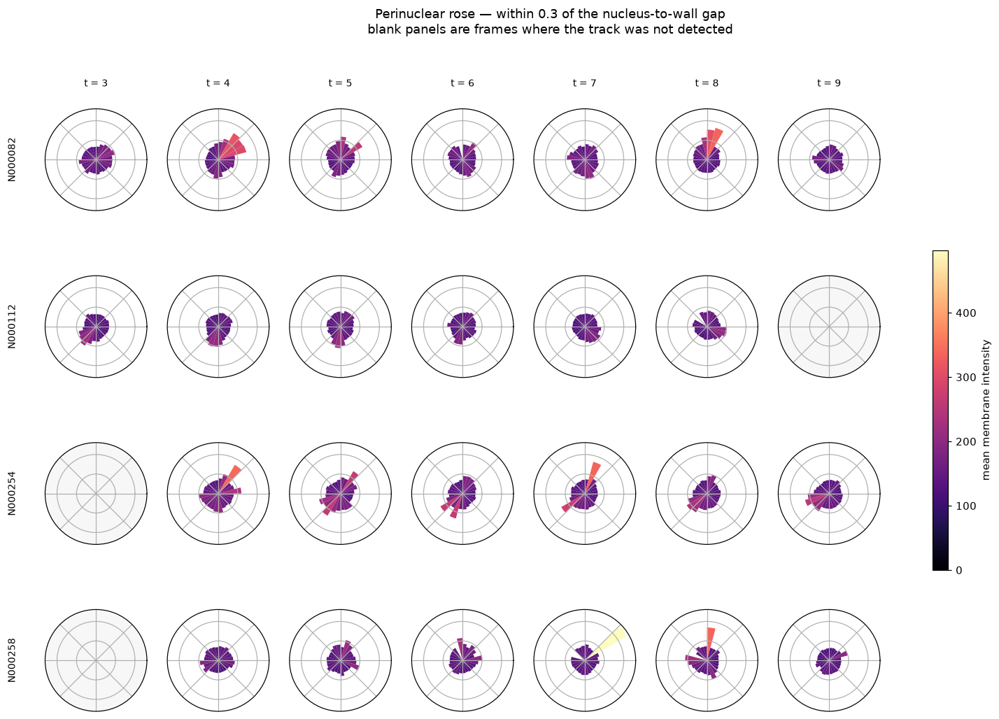

In [10]:
GAP   = 0.30      # fraction of the nucleus-to-wall gap to include
NBINS = 24

band = sweep[(sweep.rho_wall_proxy > 0) & (sweep.rho_wall_proxy <= GAP)]

profiles, vmax = {}, 0.0
for nid in FOCAL:
    for t in FRAMES:
        sub = band[(band.nucleus_id == nid) & (band.time_frame == t)]
        if sub.empty:
            continue
        th, mean, _ = angular_profile(sub, NBINS)
        profiles[(nid, t)] = (th, np.nan_to_num(mean))
        vmax = max(vmax, float(np.nanmax(mean)))

fig, axes = plt.subplots(len(FOCAL), len(FRAMES),
                         figsize=(2.5 * len(FRAMES), 2.7 * len(FOCAL)),
                         subplot_kw={"projection": "polar"}, squeeze=False)
width = 2 * np.pi / NBINS
norm = plt.Normalize(0, vmax)
for r, nid in enumerate(FOCAL):
    for k, t in enumerate(FRAMES):
        ax = axes[r][k]; orient_polar(ax)
        ax.set_xticklabels([]); ax.set_yticklabels([])
        ax.set_ylim(0, vmax * 1.05)
        if (nid, t) not in profiles:
            ax.set_facecolor("0.97")
        else:
            th, vals = profiles[(nid, t)]
            ax.bar(th - width / 2, vals, width=width, align="edge",
                   color=plt.get_cmap("magma")(norm(vals)), edgecolor="none")
        if r == 0:
            ax.text(.5, 1.22, f"t = {t}", transform=ax.transAxes, ha="center", fontsize=9)
    axes[r][0].set_ylabel(short(nid), fontsize=9, labelpad=26)

fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap="magma"), ax=axes,
             shrink=.5, label=f"mean {CHANNEL.lower()} intensity")
fig.suptitle(f"Perinuclear rose — within {GAP} of the nucleus-to-wall gap\n"
             "blank panels are frames where the track was not detected", fontsize=12)
fig.savefig(FIGDIR / "rose_perinuclear.png", bbox_inches="tight")

## 10 · Envelope rose — radius of peak intensity by angle

Four tracks, all timepoints overlaid by colour. The pipeline plots this in um;
only rho survives the export, so the shape is comparable and the scale is not.

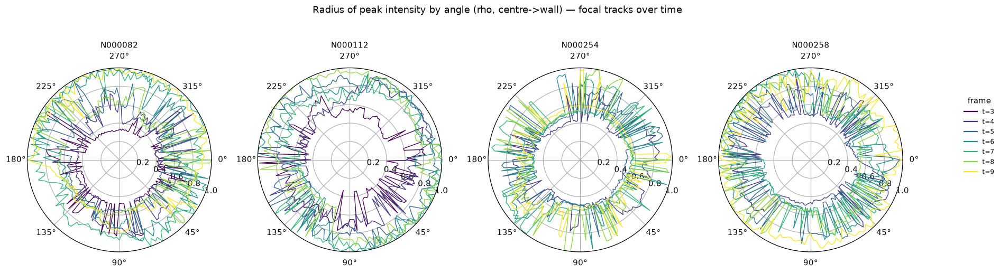

In [11]:
peaks = ray_peaks(sweep)
cmap = plt.get_cmap("viridis")
cn = {t: cmap(i / max(len(FRAMES) - 1, 1)) for i, t in enumerate(FRAMES)}

fig, axes = plt.subplots(1, len(FOCAL), figsize=(4.3 * len(FOCAL), 4.8),
                         subplot_kw={"projection": "polar"}, squeeze=False)
for ax, nid in zip(axes[0], FOCAL):
    orient_polar(ax)
    for t, g in peaks[peaks.nucleus_id == nid].groupby("time_frame"):
        g = g.sort_values("theta_deg")
        th, r = np.radians(g.theta_deg.to_numpy()), g.rho_at_peak.to_numpy()
        ax.plot(np.append(th, th[0]), np.append(r, r[0]), lw=.9, color=cn[t])
    ax.set_title(short(nid), fontsize=10)
    ax.set_ylim(0, 1)

fig.legend(handles=[plt.Line2D([], [], color=cn[t], label=f"t={t}") for t in FRAMES],
           loc="center right", frameon=False, fontsize=8, title="frame")
fig.suptitle("Radius of peak intensity by angle (rho, centre->wall) — focal tracks over time")
fig.tight_layout(rect=[0, 0, .93, .93])
fig.savefig(FIGDIR / "rose_individual.png", bbox_inches="tight")

### 10b · Pooled over all nuclei, per frame

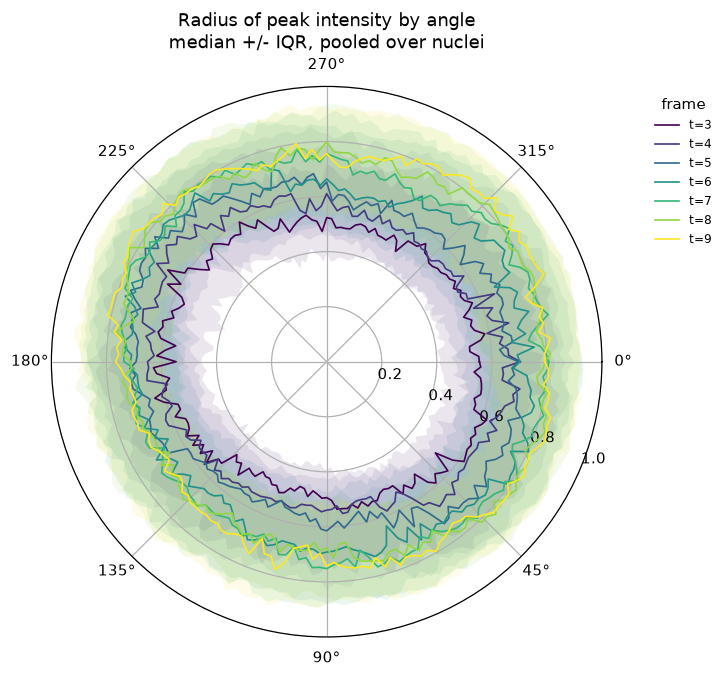

In [12]:
fig, ax = plt.subplots(figsize=(6.5, 6.5), subplot_kw={"projection": "polar"})
orient_polar(ax)

for t in FRAMES:
    g = (peaks[peaks.time_frame == t].groupby("theta_deg")["rho_at_peak"]
         .agg(med="median", q1=lambda s: s.quantile(.25), q3=lambda s: s.quantile(.75))
         .reset_index().sort_values("theta_deg"))
    th = np.radians(g.theta_deg.to_numpy()); thc = np.append(th, th[0])
    ax.plot(thc, np.append(g["med"], g["med"].iloc[0]), lw=1.1, color=cn[t], label=f"t={t}")
    ax.fill_between(thc, np.append(g.q1, g.q1.iloc[0]),
                    np.append(g.q3, g.q3.iloc[0]), color=cn[t], alpha=.10, lw=0)

ax.set_ylim(0, 1)
ax.legend(frameon=False, fontsize=8, title="frame", bbox_to_anchor=(1.22, 1.0))
ax.set_title("Radius of peak intensity by angle\nmedian +/- IQR, pooled over nuclei")
fig.savefig(FIGDIR / "rose_pooled.png", bbox_inches="tight")

## 11 · Intensity by angle and radius

Rows are the focal tracks, columns timepoints. A ring that stays at fixed rho
while the nucleus grows means the envelope is scaling with the nucleus.

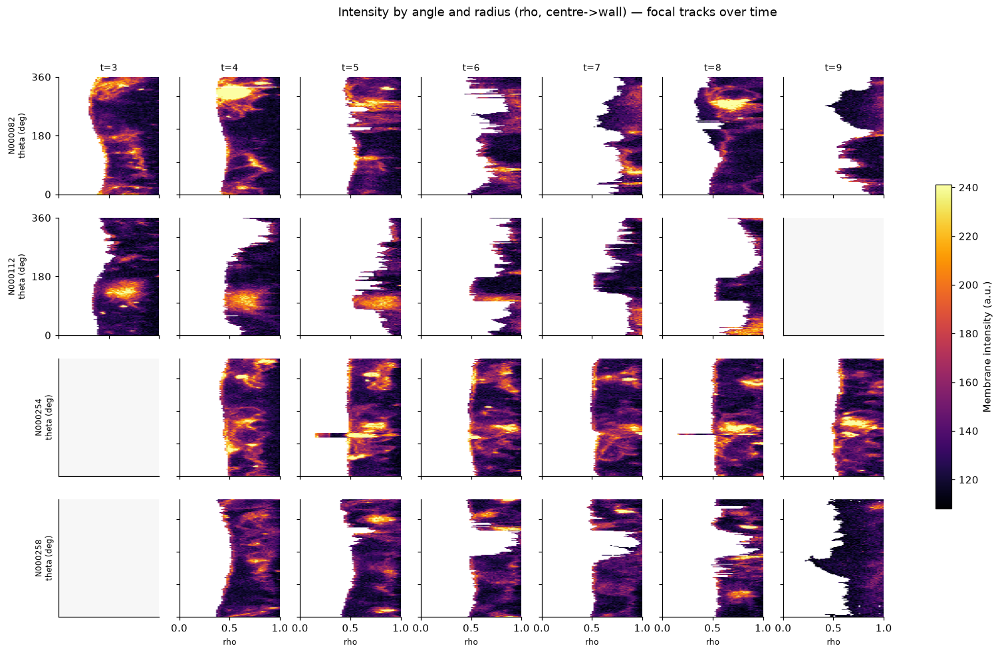

In [13]:
RHO_BINS = 60
d = sweep[sweep.nucleus_id.isin(FOCAL)]
edges = np.linspace(0, 1, RHO_BINS + 1)
vmin, vmax = np.nanpercentile(d.intensity, [2, 98])

fig, axes = plt.subplots(len(FOCAL), len(FRAMES),
                         figsize=(2.6 * len(FRAMES), 2.4 * len(FOCAL)), squeeze=False)
im = None
for r, nid in enumerate(FOCAL):
    for k, t in enumerate(FRAMES):
        ax = axes[r][k]
        sub = d[(d.nucleus_id == nid) & (d.time_frame == t)].copy()
        if sub.empty:
            ax.set_facecolor("0.97"); ax.set_xticks([]); ax.set_yticks([])
        else:
            sub["rb"] = pd.cut(sub.rho_normalized, edges, labels=False, include_lowest=True)
            grid = sub.pivot_table(index="theta_deg", columns="rb", values="intensity",
                                   aggfunc="mean").reindex(columns=range(RHO_BINS))
            im = ax.imshow(grid.to_numpy(), aspect="auto", origin="lower", cmap="inferno",
                           vmin=vmin, vmax=vmax, extent=[0, 1, 0, 360])
            if r == len(FOCAL) - 1:
                ax.set_xlabel("rho", fontsize=8)
            else:
                ax.set_xticklabels([])
            if k == 0:
                ax.set_yticks([0, 180, 360])
            else:
                ax.set_yticklabels([])
        if r == 0:
            ax.set_title(f"t={t}", fontsize=9)
        if k == 0:
            ax.set_ylabel(f"{short(nid)}\ntheta (deg)", fontsize=8)

if im is not None:
    fig.colorbar(im, ax=axes, shrink=.6, label=f"{CHANNEL} intensity (a.u.)")
fig.suptitle("Intensity by angle and radius (rho, centre->wall) — focal tracks over time")
fig.savefig(FIGDIR / "angle_distance.png", bbox_inches="tight")

## 12 · Membrane asymmetry

`R` is the intensity-weighted resultant after a per-shell baseline subtraction.
`R_geom` is the resultant of sample counts alone — what an isotropic nucleus
would show purely from droplet-wall clipping. **R must beat R_geom.**

In [14]:
asym = asymmetry(sweep)
print(asym.shape)
display(asym.groupby("shell")[["R", "R_geom", "n_eff"]].median().round(3))

(3958, 11)


,R,R_geom,n_eff
shell,,,
"(0.00, 0.25]",0.858,0.863,6.532
"(0.25, 0.50]",0.513,0.616,12.977
"(0.50, 0.75]",0.432,0.239,15.854
"(0.75, 1.00]",0.381,0.146,17.497


### 12a · Direction of the bright side over time

Grey bars are the population; coloured arrows are the focal tracks, so you can
see whether an individual nucleus holds its direction while the population stays
isotropic. Black line is the population resultant.

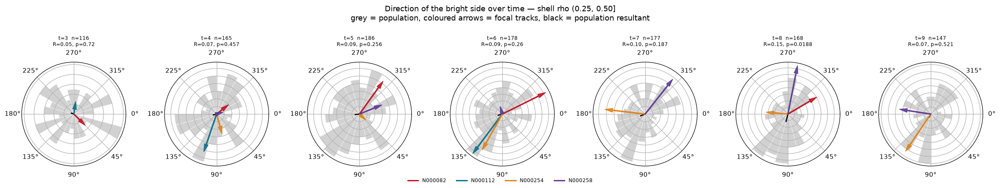

In [15]:
SHELL = asym.shell.unique()[1]        # the shell holding the ring
NB = 24

d = asym[asym.shell == SHELL]
pop = population_direction(d).set_index("time_frame")
edges = np.linspace(0, 2 * np.pi, NB + 1)

fig, axes = plt.subplots(1, len(FRAMES), figsize=(3.1 * len(FRAMES), 4.0),
                         subplot_kw={"projection": "polar"}, squeeze=False)
for k, t in enumerate(FRAMES):
    ax = axes[0][k]; orient_polar(ax)
    phi = d.loc[d.time_frame == t, "phi"].dropna().to_numpy() % (2 * np.pi)
    counts, _ = np.histogram(phi, bins=edges)
    ax.bar(edges[:-1], counts, width=np.diff(edges), align="edge",
           color="0.82", edgecolor="w", lw=.4)
    hmax = counts.max() or 1
    if t in pop.index and np.isfinite(pop.loc[t, "R_pop"]):
        ax.plot([pop.loc[t, "mean_phi"]] * 2, [0, pop.loc[t, "R_pop"] * hmax],
                color="k", lw=1.8)
        ax.set_title(f"t={t}  n={phi.size}\nR={pop.loc[t,'R_pop']:.2f}, "
                     f"p={pop.loc[t,'p']:.3g}", fontsize=8)
    for nid in FOCAL:
        row = d[(d.nucleus_id == nid) & (d.time_frame == t)]
        if row.empty or not np.isfinite(row.phi.iloc[0]):
            continue
        ax.annotate("", xy=(row.phi.iloc[0], row.R.iloc[0] * hmax), xytext=(0, 0),
                    arrowprops=dict(color=FC[nid], width=1.4, headwidth=6, alpha=.9))
    ax.set_yticklabels([])

fig.legend(handles=[plt.Line2D([], [], color=FC[n], lw=2, label=short(n)) for n in FOCAL],
           loc="lower center", ncol=len(FOCAL), frameon=False, fontsize=8)
fig.suptitle(f"Direction of the bright side over time — shell rho {SHELL}\n"
             "grey = population, coloured arrows = focal tracks, black = population resultant")
fig.tight_layout(rect=[0, .07, 1, .86])
fig.savefig(FIGDIR / "direction_windrose.png", bbox_inches="tight")

### 12b · Asymmetry against time

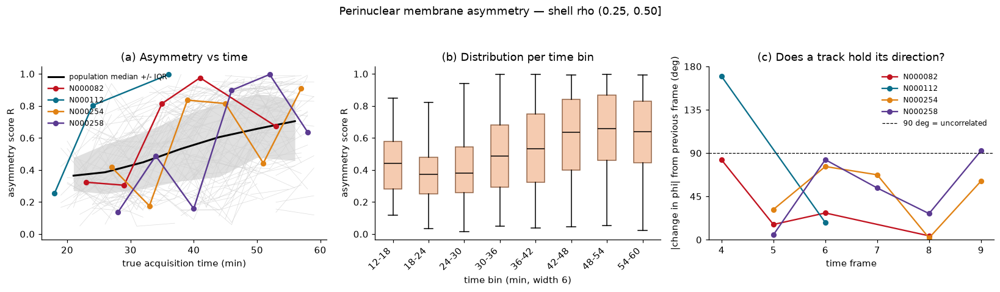

In [16]:
d = (asym[asym.shell == SHELL]
     .merge(df_all[["nucleus_id", "time_frame", "time_min"]],
            on=["nucleus_id", "time_frame"], how="left"))

fig, (a, b, c) = plt.subplots(1, 3, figsize=(15, 4.4))

for _, g in d.groupby("nucleus_id"):
    g = g.sort_values("time_min")
    a.plot(g.time_min, g.R, color="0.82", lw=.5, alpha=.7)
q = d.groupby("time_frame").agg(t=("time_min", "median"), m=("R", "median"),
                                lo=("R", lambda s: s.quantile(.25)),
                                hi=("R", lambda s: s.quantile(.75)))
a.plot(q.t, q.m, color="k", lw=2, label="population median +/- IQR")
a.fill_between(q.t, q.lo, q.hi, color="k", alpha=.12, lw=0)
for nid in FOCAL:
    g = d[d.nucleus_id == nid].sort_values("time_min")
    a.plot(g.time_min, g.R, "-o", ms=5, lw=1.6, color=FC[nid], label=short(nid))
a.set_xlabel("true acquisition time (min)"); a.set_ylabel("asymmetry score R")
a.set_title("(a) Asymmetry vs time"); a.legend(frameon=False, fontsize=8)

edges = np.arange(0, d.time_min.max() + BIN_MIN, BIN_MIN)
labels = [f"{int(x)}-{int(y)}" for x, y in zip(edges[:-1], edges[1:])]
dd = d.assign(bin=pd.cut(d.time_min, edges, labels=labels,
                         include_lowest=True)).dropna(subset=["bin"])
order = [x for x in labels if (dd["bin"] == x).any()]
bp = boxplot(b, [dd.loc[dd["bin"] == x, "R"].to_numpy() for x in order], order,
             patch_artist=True, showfliers=False, medianprops=dict(color="k"))
for box in bp["boxes"]:
    box.set(facecolor="#f4c6a8", alpha=.9, edgecolor="#8a5a3b")
b.set_xlabel(f"time bin (min, width {int(BIN_MIN)})"); b.set_ylabel("asymmetry score R")
b.set_title("(b) Distribution per time bin")
plt.setp(b.get_xticklabels(), rotation=45, ha="right")

for nid in FOCAL:
    g = d[d.nucleus_id == nid].sort_values("time_frame")
    if len(g) < 2:
        continue
    dphi = np.degrees(np.angle(np.exp(1j * np.diff(g.phi.to_numpy()))))
    c.plot(g.time_frame.to_numpy()[1:], np.abs(dphi), "-o", ms=5, color=FC[nid],
           label=short(nid))
c.axhline(90, color="k", ls="--", lw=.8, label="90 deg = uncorrelated")
c.set_xlabel("time frame"); c.set_ylabel("|change in phi| from previous frame (deg)")
c.set_ylim(0, 180); c.set_yticks([0, 45, 90, 135, 180])
c.set_title("(c) Does a track hold its direction?"); c.legend(frameon=False, fontsize=8)

fig.suptitle(f"Perinuclear membrane asymmetry — shell rho {SHELL}")
fig.tight_layout(rect=[0, 0, 1, .93])
fig.savefig(FIGDIR / "asymmetry_timecourse.png", bbox_inches="tight")

### 12c · By shell over time, against the geometry floor

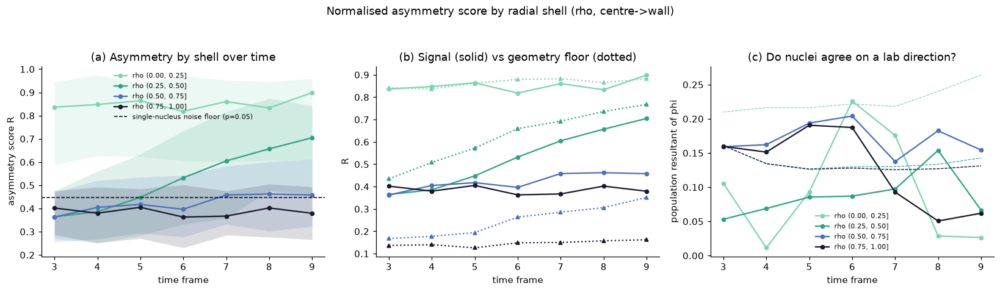

In [17]:
shells = sorted(asym.shell.unique())
cols = dict(zip(shells, SHELL_COLORS))

fig, (a, b, c) = plt.subplots(1, 3, figsize=(15, 4.4))
for s in shells:
    g = asym[asym.shell == s].groupby("time_frame")
    m = g.R.median()
    a.plot(m.index, m, "-o", color=cols[s], ms=4, label=f"rho {s}")
    a.fill_between(m.index, g.R.quantile(.25), g.R.quantile(.75),
                   color=cols[s], alpha=.15, lw=0)
    b.plot(m.index, m, "-o", color=cols[s], ms=4, label=f"rho {s}")
    b.plot(m.index, g.R_geom.median(), ":^", color=cols[s], ms=4)

a.axhline(np.sqrt(-np.log(.05) / max(int(asym.n_eff.median()), 1)), ls="--",
          color="k", lw=1, label="single-nucleus noise floor (p=0.05)")
a.set_xlabel("time frame"); a.set_ylabel("asymmetry score R")
a.set_title("(a) Asymmetry by shell over time"); a.legend(frameon=False, fontsize=7)
b.set_xlabel("time frame"); b.set_ylabel("R")
b.set_title("(b) Signal (solid) vs geometry floor (dotted)")

pop = population_direction(asym)
for s in shells:
    g = pop[pop.shell == s]
    c.plot(g.time_frame, g.R_pop, "-o", color=cols[s], ms=4, label=f"rho {s}")
    c.plot(g.time_frame, np.sqrt(-np.log(.05) / g.n.clip(lower=1)), "--",
           color=cols[s], lw=.8)
c.set_xlabel("time frame"); c.set_ylabel("population resultant of phi")
c.set_title("(c) Do nuclei agree on a lab direction?"); c.legend(frameon=False, fontsize=7)

fig.suptitle("Normalised asymmetry score by radial shell (rho, centre->wall)")
fig.tight_layout(rect=[0, 0, 1, .93])
fig.savefig(FIGDIR / "asymmetry_by_shell.png", bbox_inches="tight")

### 12d · Aggregate, direction discarded

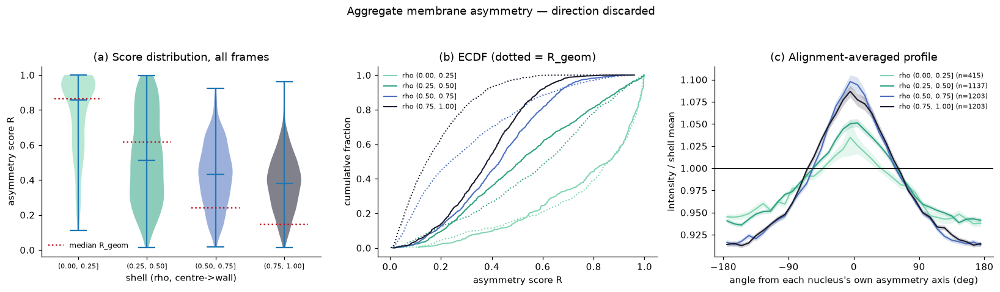

In [18]:
NB = 36
fig, (a, b, c) = plt.subplots(1, 3, figsize=(15, 4.4))

data = [asym.loc[asym.shell == s, "R"].dropna().to_numpy() for s in shells]
parts = a.violinplot(data, showmedians=True, showextrema=True)
for pc, s in zip(parts["bodies"], shells):
    pc.set_facecolor(cols[s]); pc.set_alpha(.55)
for i, s in enumerate(shells, start=1):
    a.plot([i - .35, i + .35], [asym.loc[asym.shell == s, "R_geom"].median()] * 2,
           ":", color="#c1121f", lw=1.6)
a.set_xticks(range(1, len(shells) + 1)); a.set_xticklabels(shells, fontsize=7)
a.set_xlabel("shell (rho, centre->wall)"); a.set_ylabel("asymmetry score R")
a.plot([], [], ":", color="#c1121f", label="median R_geom")
a.set_title("(a) Score distribution, all frames"); a.legend(frameon=False, fontsize=8)

for s in shells:
    g = asym[asym.shell == s]
    for col, ls, lab in (("R", "-", f"rho {s}"), ("R_geom", ":", None)):
        v = np.sort(g[col].dropna().to_numpy())
        if v.size:
            b.plot(v, np.arange(1, v.size + 1) / v.size, ls, color=cols[s], lw=1.3, label=lab)
b.set_xlabel("asymmetry score R"); b.set_ylabel("cumulative fraction")
b.set_title("(b) ECDF (dotted = R_geom)"); b.legend(frameon=False, fontsize=7)

phi_lookup = asym.set_index(["nucleus_id", "time_frame", "shell"])["phi"]
centres = np.linspace(-180, 180, NB, endpoint=False) + 180 / NB
for s in shells:
    lo, hi = asym.loc[asym.shell == s, ["shell_lo", "shell_hi"]].iloc[0]
    sub_all = sweep[(sweep.rho_normalized > lo) & (sweep.rho_normalized <= hi)]
    stack = []
    for (nid, t), g in sub_all.groupby(["nucleus_id", "time_frame"], sort=False):
        phi = phi_lookup.get((nid, t, s), np.nan)
        if not np.isfinite(phi):
            continue
        _, mean, _ = angular_profile(g, NB)
        if not np.isfinite(mean).any() or np.nanmean(mean) <= 0:
            continue
        shift = int(round(np.degrees(phi) / (360 / NB)))
        stack.append(np.roll(mean / np.nanmean(mean), -shift + NB // 2))
    if stack:
        arr = np.vstack(stack)
        med = np.nanmedian(arr, axis=0)
        se = np.nanstd(arr, axis=0) / max(np.sqrt(arr.shape[0]), 1)
        c.plot(centres, med, color=cols[s], lw=1.4, label=f"rho {s} (n={arr.shape[0]})")
        c.fill_between(centres, med - se, med + se, color=cols[s], alpha=.2, lw=0)
c.axhline(1.0, color="k", lw=.7)
c.set_xlabel("angle from each nucleus's own asymmetry axis (deg)")
c.set_ylabel("intensity / shell mean"); c.set_xticks([-180, -90, 0, 90, 180])
c.set_title("(c) Alignment-averaged profile"); c.legend(frameon=False, fontsize=7)

fig.suptitle("Aggregate membrane asymmetry — direction discarded")
fig.tight_layout(rect=[0, 0, 1, .93])
fig.savefig(FIGDIR / "asymmetry_aggregate.png", bbox_inches="tight")

### 12e · Shell x frame rose grid, one figure per focal track

Wedge radius is sqrt(intensity above baseline), so wedge **area** is proportional
to intensity. Grey wedges are angles with no sample — almost always droplet-wall
clipping. Red arrow is the resultant.

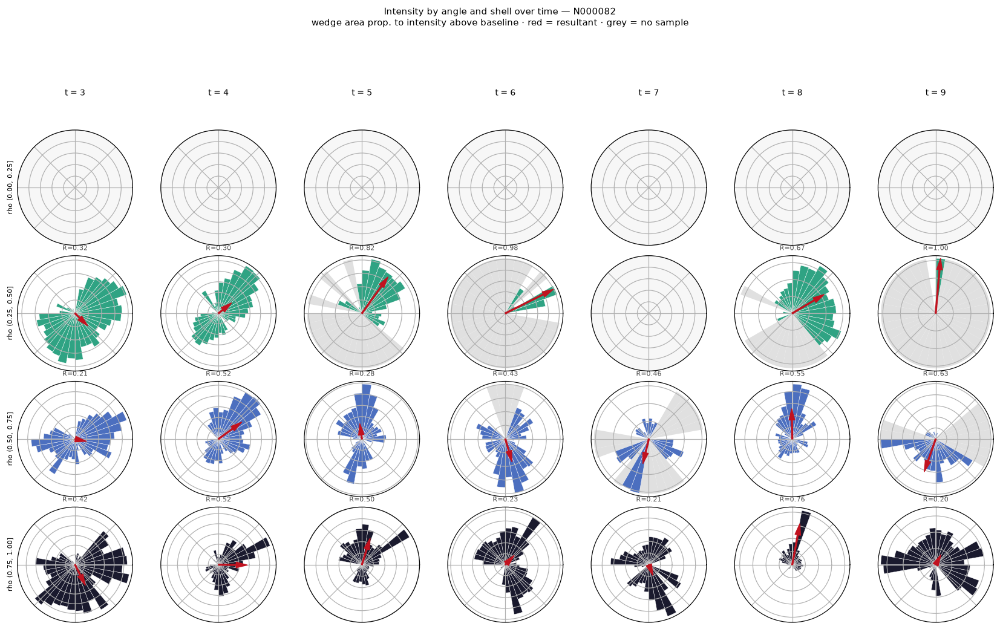

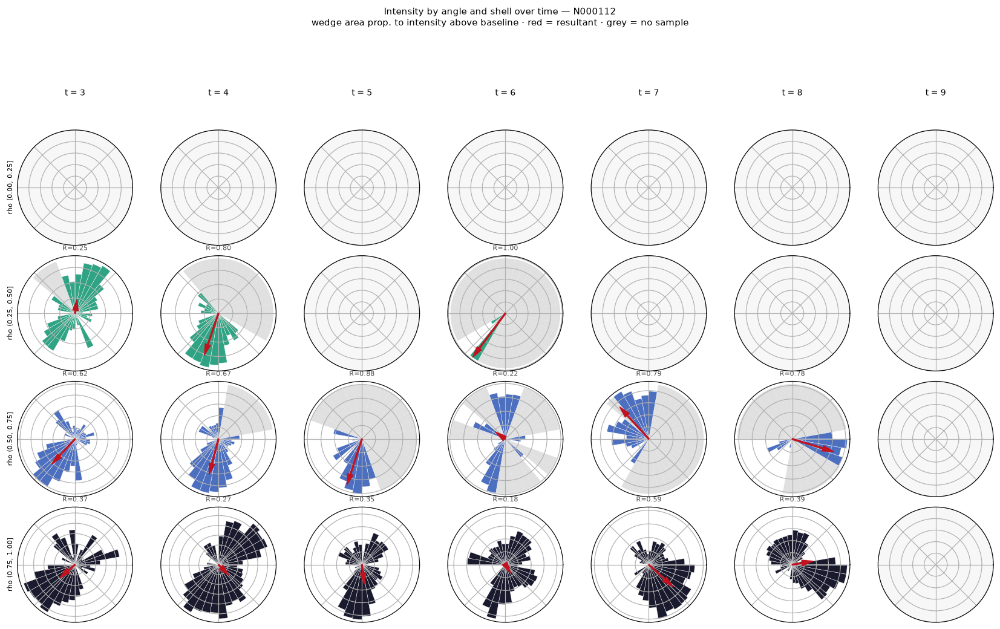

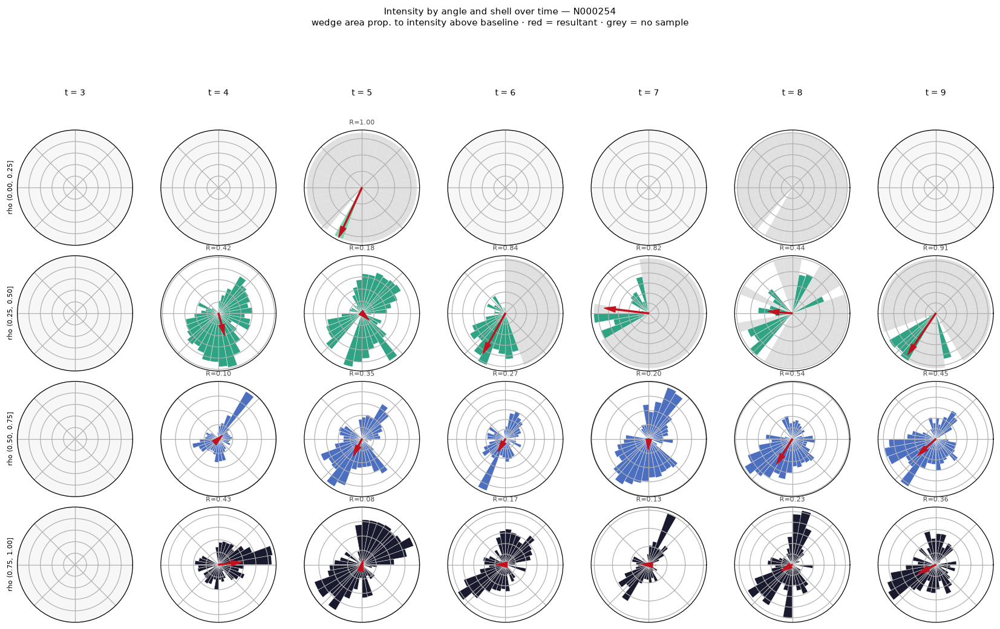

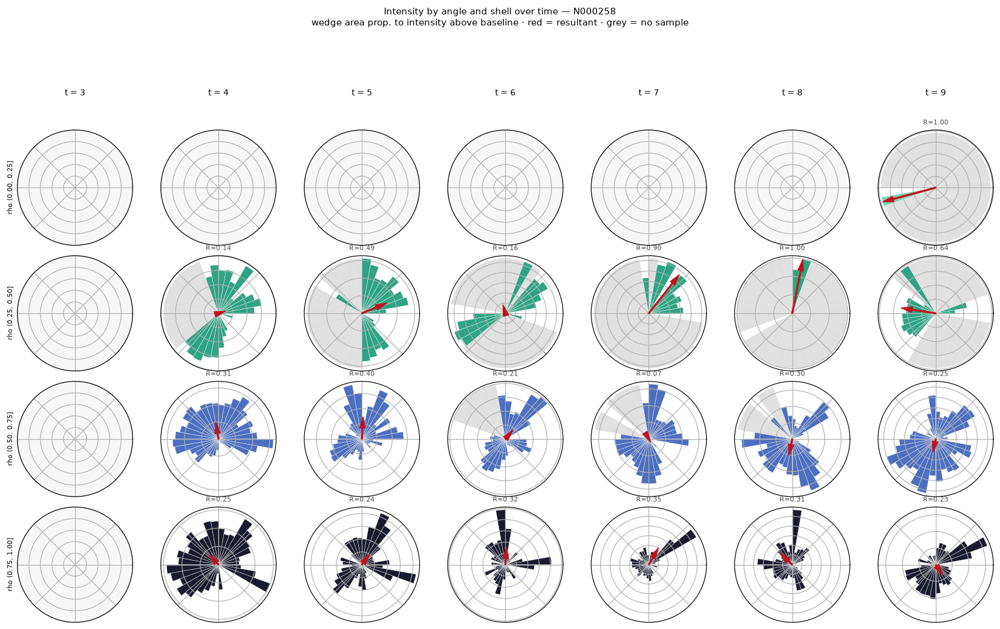

In [19]:
NB = 36
edges = np.linspace(0, 2 * np.pi, NB + 1)

for nid in FOCAL:
    d = sweep[sweep.nucleus_id == nid]
    fig, axes = plt.subplots(len(SHELLS), len(FRAMES),
                             figsize=(2.2 * len(FRAMES), 2.4 * len(SHELLS)),
                             subplot_kw={"projection": "polar"}, squeeze=False)
    for r, ((lo, hi), col) in enumerate(zip(SHELLS, SHELL_COLORS)):
        for k, t in enumerate(FRAMES):
            ax = axes[r][k]; orient_polar(ax)
            ax.set_xticklabels([]); ax.set_yticklabels([])
            sub = d[(d.time_frame == t) & (d.rho_normalized > lo)
                    & (d.rho_normalized <= hi)]
            if sub.empty:
                ax.set_facecolor("0.97")
            else:
                th, mean, count = angular_profile(sub, NB)
                base = np.nanpercentile(mean[np.isfinite(mean)], 10)
                w = np.clip(np.nan_to_num(mean - base), 0, None)
                h = np.sqrt(w); hmax = h.max() or 1
                miss = count == 0
                if miss.any():
                    ax.bar(edges[:-1][miss], np.full(miss.sum(), hmax),
                           width=np.diff(edges)[miss], align="edge",
                           color="0.88", zorder=0)
                ax.bar(edges[:-1], h, width=np.diff(edges), align="edge",
                       color=col, edgecolor="w", lw=.3)
                R, phi = resultant(th, w)
                if np.isfinite(R):
                    ax.annotate("", xy=(phi, R * hmax), xytext=(0, 0),
                                arrowprops=dict(color="#c1121f", width=1.2, headwidth=6))
                    ax.set_title(f"R={R:.2f}", fontsize=7, color="0.3")
            if k == 0:
                ax.set_ylabel(f"rho ({lo:.2f}, {hi:.2f}]", fontsize=7)
            if r == 0:
                ax.text(.5, 1.30, f"t = {t}", transform=ax.transAxes,
                        ha="center", fontsize=9)
    fig.suptitle(f"Intensity by angle and shell over time — {short(nid)}\n"
                 "wedge area prop. to intensity above baseline · red = resultant · "
                 "grey = no sample", fontsize=10)
    fig.tight_layout(rect=[0, 0, 1, .90])
    fig.savefig(FIGDIR / f"shell_rose_{short(nid)}.png", bbox_inches="tight")
    plt.show()

## 13 · Intensity surfaces over time

Rows are the focal tracks, columns timepoints. rho and theta are mapped to
Cartesian, so each surface sits over the nucleus's own footprint with the
nucleus at the centre and Z as intensity. Z is on a shared scale so panels are
comparable across both nuclei and time.

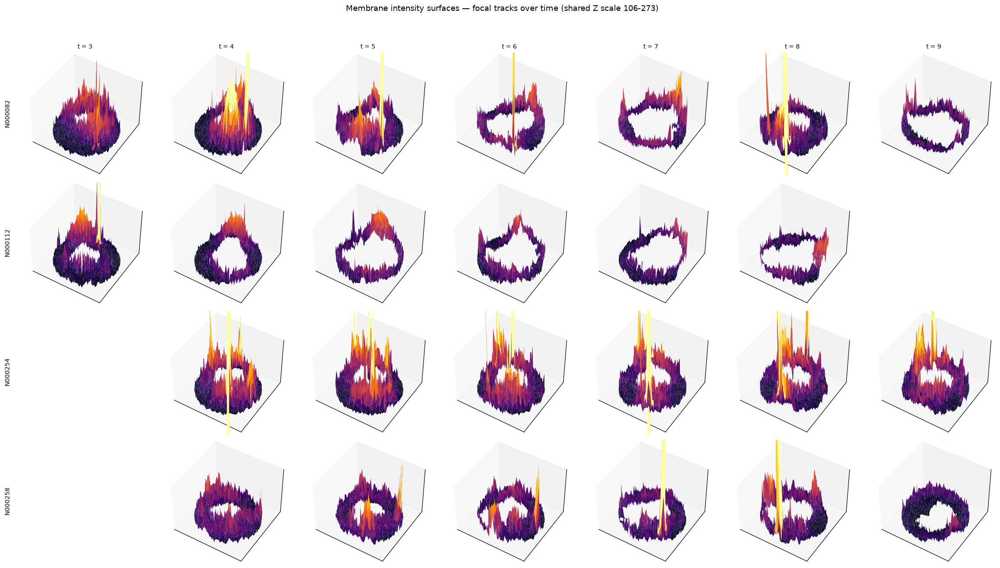

In [20]:
RHO_BINS = 60
d = sweep[sweep.nucleus_id.isin(FOCAL)]
zmin, zmax = np.nanpercentile(d.intensity, [1, 99])

fig = plt.figure(figsize=(3.0 * len(FRAMES), 3.0 * len(FOCAL)))
for r, nid in enumerate(FOCAL):
    for k, t in enumerate(FRAMES):
        ax = fig.add_subplot(len(FOCAL), len(FRAMES), r * len(FRAMES) + k + 1,
                             projection="3d")
        one = d[(d.nucleus_id == nid) & (d.time_frame == t)]
        ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
        if one.empty:
            ax.set_axis_off()
        else:
            THETA, RHO, Z = sweep_grid(one, rho_bins=RHO_BINS)
            X, Y = polar_xy(THETA, RHO)
            ax.plot_surface(X, Y, fill_gaps(Z), cmap="inferno", linewidth=0,
                            antialiased=True, vmin=zmin, vmax=zmax)
            ax.set_zlim(zmin, zmax)
            ax.view_init(elev=45, azim=-58)
        if r == 0:
            ax.set_title(f"t = {t}", fontsize=9)
        if k == 0:
            ax.text2D(-0.15, 0.5, short(nid), transform=ax.transAxes,
                      rotation=90, va="center", fontsize=9)

fig.suptitle(f"{CHANNEL} intensity surfaces — focal tracks over time "
             f"(shared Z scale {zmin:.0f}-{zmax:.0f})", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, .95])
fig.savefig(FIGDIR / "surface_focal_grid.png", bbox_inches="tight")

### 13b · One track, large enough to read the envelope structure

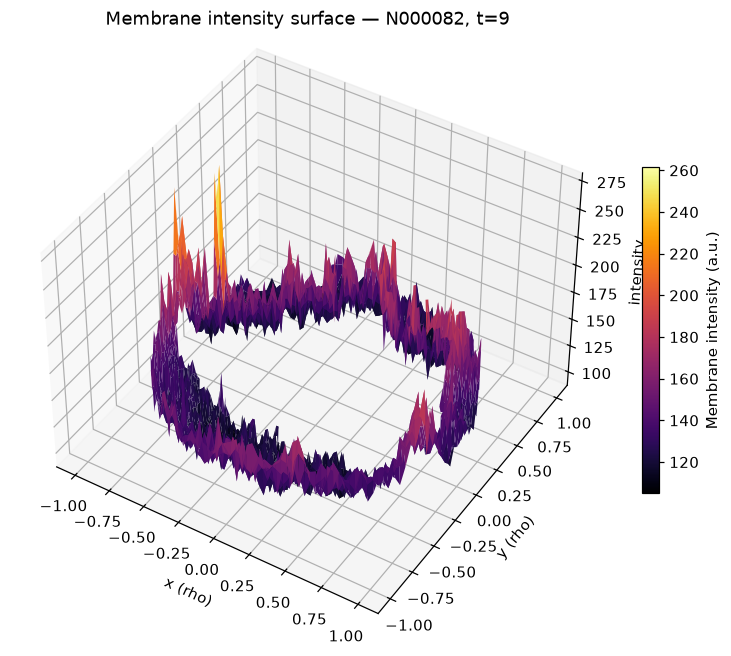

In [21]:
NID, T = FOCAL[0], FRAMES[-1]
one = sweep[(sweep.nucleus_id == NID) & (sweep.time_frame == T)]

THETA, RHO, Z = sweep_grid(one, rho_bins=RHO_BINS)
Z = fill_gaps(Z)
X, Y = polar_xy(THETA, RHO)

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection="3d")
s = ax.plot_surface(X, Y, Z, cmap="inferno", linewidth=0, antialiased=True,
                    rstride=1, cstride=1)
ax.set_xlabel("x (rho)"); ax.set_ylabel("y (rho)"); ax.set_zlabel("intensity")
ax.view_init(elev=42, azim=-58)
fig.colorbar(s, shrink=.55, label=f"{CHANNEL} intensity (a.u.)")
ax.set_title(f"{CHANNEL} intensity surface — {short(NID)}, t={T}")
fig.savefig(FIGDIR / "surface_polar.png", bbox_inches="tight")

### 13c · Pooled across nuclei, over time

Drop the focal filter and the pivot's mean pools everything — shows whether a
feature is systematic or belongs to one nucleus.

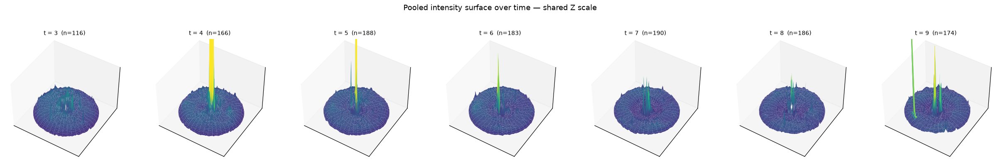

In [22]:
fig = plt.figure(figsize=(3.2 * len(FRAMES), 3.6))
for k, t in enumerate(FRAMES):
    ax = fig.add_subplot(1, len(FRAMES), k + 1, projection="3d")
    allnuc = sweep[sweep.time_frame == t]
    THETA_a, RHO_a, Z_a = sweep_grid(allnuc, rho_bins=RHO_BINS)
    X_a, Y_a = polar_xy(THETA_a, RHO_a)
    ax.plot_surface(X_a, Y_a, fill_gaps(Z_a), cmap="viridis", linewidth=0,
                    antialiased=True, vmin=zmin, vmax=zmax)
    ax.set_zlim(zmin, zmax)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.view_init(elev=45, azim=-58)
    ax.set_title(f"t = {t}  (n={allnuc.nucleus_id.nunique()})", fontsize=9)

fig.suptitle("Pooled intensity surface over time — shared Z scale", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, .90])
fig.savefig(FIGDIR / "surface_pooled.png", bbox_inches="tight")

## 14 · Figures written

In [23]:
for p in sorted(FIGDIR.glob("*.png")):
    print(f"{p.stat().st_size/1e3:8.0f} kB  {p.name}")

    1999 kB  angle_distance.png
     180 kB  area_bins.png
     269 kB  area_timecourse.png
     373 kB  asymmetry_aggregate.png
     329 kB  asymmetry_by_shell.png
     494 kB  asymmetry_timecourse.png
     719 kB  direction_windrose.png
     370 kB  dual_axis.png
     157 kB  nc_ratio.png
    1408 kB  rose_individual.png
     769 kB  rose_perinuclear.png
     514 kB  rose_pooled.png
    1576 kB  shell_rose_N000082.png
    1461 kB  shell_rose_N000112.png
    1582 kB  shell_rose_N000254.png
    1556 kB  shell_rose_N000258.png
    1898 kB  shell_rose_grid.png
    2177 kB  surface_focal_grid.png
     481 kB  surface_polar.png
     722 kB  surface_pooled.png
     305 kB  surface_rect.png
